<a href="https://colab.research.google.com/github/Slautin/2025_Attention/blob/main/1_Attention%26SHAP_gaussian_peaks.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 2025 Attention and SHAP: Gaussian spectra

**Notebook 1/3**

06/03/2025

- Author: **Boris Slautin**
- Idea: **Sergei Kalinin** and **Utkarsh Pratiush**
- Transformer model: **Utkarsh Pratiush**


In [1]:
import numpy as np
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset

import shap
np.random.seed(42)
torch.manual_seed(42)

# 1. Data Generation




Here, we define functions to generate synthetic spectra, each composed of three Gaussian peaks with added noise. The parameters (amplitude, position, width) of these peaks are randomly sampled from uniform distributions.

Amplitude of the first peak is treated as target value for regressor


In [2]:
n_samples = 500
n_points = 100  # Number of points in each spectrum
x_range = np.linspace(0, 10, n_points)

def gaussian(x, amplitude, position, width):
    return amplitude * np.exp(-(x - position)**2 / (2 * width**2))

def generate_data(n_samples, seed=42):
    np.random.seed(seed)
    spectra = []
    A1_values = []
    A2_values = []
    A3_values = []

    pos1_values = []
    width1_values = []

    for _ in range(n_samples):
        A1 = np.random.uniform(0.5, 2.0)  # Amplitude of peak 1
        A2 = np.random.uniform(0.5, 2.0)
        A3 = np.random.uniform(0.5, 2.0)

        pos1 = np.random.uniform(2.0, 3.0)  # Position of peak 1
        pos2 = np.random.uniform(5.0, 6.0)  # Position of peak 2
        pos3 = np.random.uniform(7.5, 8.5)  # Position of peak 3

        width1 = np.random.uniform(0.2, 0.4)
        width2 = np.random.uniform(0.2, 0.4)
        width3 = np.random.uniform(0.2, 0.4)

        spectrum = (gaussian(x_range, A1, pos1, width1) +
                   gaussian(x_range, A2, pos2, width2) +
                   gaussian(x_range, A3, pos3, width3))

        # Add some noise
        noise = np.random.normal(0, 0.05, n_points)
        spectrum += noise

        spectra.append(spectrum)
        A1_values.append(A1)
        A2_values.append(A2)
        A3_values.append(A3)
        pos1_values.append(pos1)
        width1_values.append(width1)

    return np.array(spectra), np.array(A1_values), np.array(A2_values), np.array(A3_values), np.array(pos1_values), np.array(width1_values)

def normalize(x):
    return (x - x.min())/np.ptp(x)

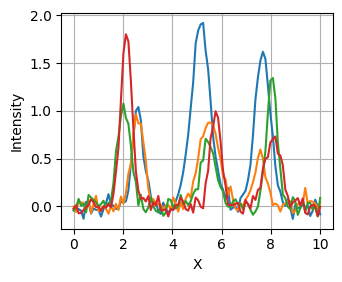

In [3]:
# Example of generated spectra
spectra, A1, A2, A3, f1, w1 = generate_data(4)

fig = plt.figure(figsize=(3.5, 2.8))
for i in range(len(spectra)):
    plt.plot(x_range, spectra[i])
plt.xlabel('X')
plt.ylabel('Intensity')
plt.grid()
plt.show()

fig.savefig('gaus_example.jpg', dpi=300, bbox_inches='tight')

# 2. Transformer Regressor


The `SelfAttention` module computes attention weights, determining the importance of each point in the spectrum relative to others.  This is a crucial part of the Transformer architecture.

In [4]:
class SelfAttention(nn.Module):
    def __init__(self, dim, heads=4):
        super().__init__()
        self.dim = dim
        self.heads = heads
        self.head_dim = dim // heads
        self.to_qkv = nn.Linear(dim, dim * 3)
        self.to_out = nn.Linear(dim, dim)
        self.scale = self.head_dim ** -0.5

    def forward(self, x):
        b, n, _ = x.shape
        qkv = self.to_qkv(x).chunk(3, dim=-1)
        q, k, v = map(lambda t: t.view(b, n, self.heads, self.head_dim).transpose(1, 2), qkv)
        dots = torch.matmul(q, k.transpose(-1, -2)) * self.scale
        attn = dots.softmax(dim=-1)
        out = torch.matmul(attn, v)
        out = out.transpose(1, 2).reshape(b, n, -1)
        out = self.to_out(out)
        self.attention_weights = attn# Save attention weights for visualization
        return out

The `TransformerRegressor` module combines embedding, positional encoding, self-attention, and feedforward layers to predict the amplitude of a Gaussian peak from the input spectrum.

In [5]:
class TransformerRegressor(nn.Module):
    def __init__(self, input_dim, hidden_dim=64, heads=4):
        super().__init__()
        self.embedding = nn.Linear(1, hidden_dim)
        self.pos_encoding = nn.Parameter(torch.randn(1, input_dim, hidden_dim))

        self.attention = SelfAttention(hidden_dim, heads=heads)
        self.norm1 = nn.LayerNorm(hidden_dim)

        self.ff = nn.Sequential(
            nn.Linear(hidden_dim, hidden_dim * 4),
            nn.GELU(),
            nn.Linear(hidden_dim * 4, hidden_dim)
        )
        self.norm2 = nn.LayerNorm(hidden_dim)
        self.to_out = nn.Linear(hidden_dim, 1)

    def forward(self, x):
        b, n = x.shape
        x = x.unsqueeze(-1)
        x = self.embedding(x)
        x = x + self.pos_encoding
        attn_out = self.attention(x)
        x = self.norm1(x + attn_out)
        ff_out = self.ff(x)
        x = self.norm2(x + ff_out)
        x = x.mean(dim=1)########## pooling
        out = self.to_out(x)
        return out

# 3. Model Training Loop


In [6]:
def visualize_attention(model, spectrum, epoch):
    import torch
    import matplotlib.pyplot as plt
    import seaborn as sns
    import numpy as np

    spectrum_tensor = torch.FloatTensor(spectrum).unsqueeze(0)

    with torch.no_grad():
        model.eval()
        _ = model(spectrum_tensor)
        attention_weights = model.attention.attention_weights.detach().cpu().numpy()

    avg_attention = attention_weights[0].mean(axis=0)
    attention_sum = avg_attention.sum(axis=0)
    attention_sum = attention_sum / attention_sum.max()  # Normalize

    fig, axs = plt.subplots(3, 1, figsize=(14, 12))

    # Plot 1: Input spectrum
    axs[0].plot(x_range, spectrum, color='blue')
    axs[0].set_title('Input Spectrum')
    axs[0].set_xlabel('x')
    axs[0].set_ylabel('Intensity')

    # Plot 2: Heatmap of attention
    sns.heatmap(avg_attention, cmap='viridis', ax=axs[1])
    axs[1].set_title(f'Attention Weights for EPOCH = {epoch}')
    axs[1].set_xlabel('Position')
    axs[1].set_ylabel('Query Position')

    # Plot 3: Overlay attention sum with spectrum
    axs[2].plot(x_range, spectrum, label='Spectrum', color='blue')
    axs[2].plot(x_range, attention_sum, label='Attention Weight', color='red', alpha=0.7)
    axs[2].set_title(f'Spectrum with Attention Weights for EPOCH = {epoch}')
    axs[2].set_xlabel('x')
    axs[2].set_ylabel('Intensity / Attention')
    axs[2].legend()

    plt.tight_layout()
    plt.show()

    return attention_sum

Starting EPCOH = 0
Sample 1 - True A1: 1.0618
Predicted A1: -0.0382


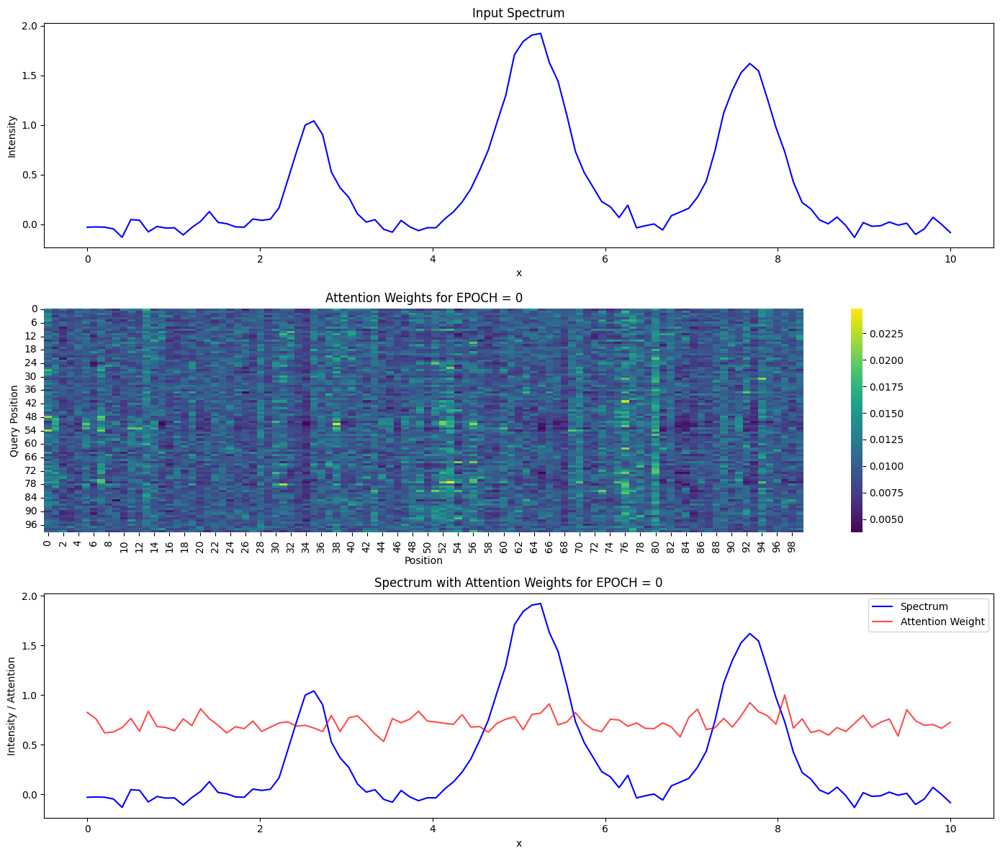

Peak positions: [2.62626263 5.25252525 7.67676768]
Attention at peaks: [0.6683631  0.8180304  0.92425877]

Epoch 1/50, Train Loss: 0.4378, Val Loss: 0.1804
Starting EPCOH = 1
Sample 1 - True A1: 1.0618
Predicted A1: 1.0340


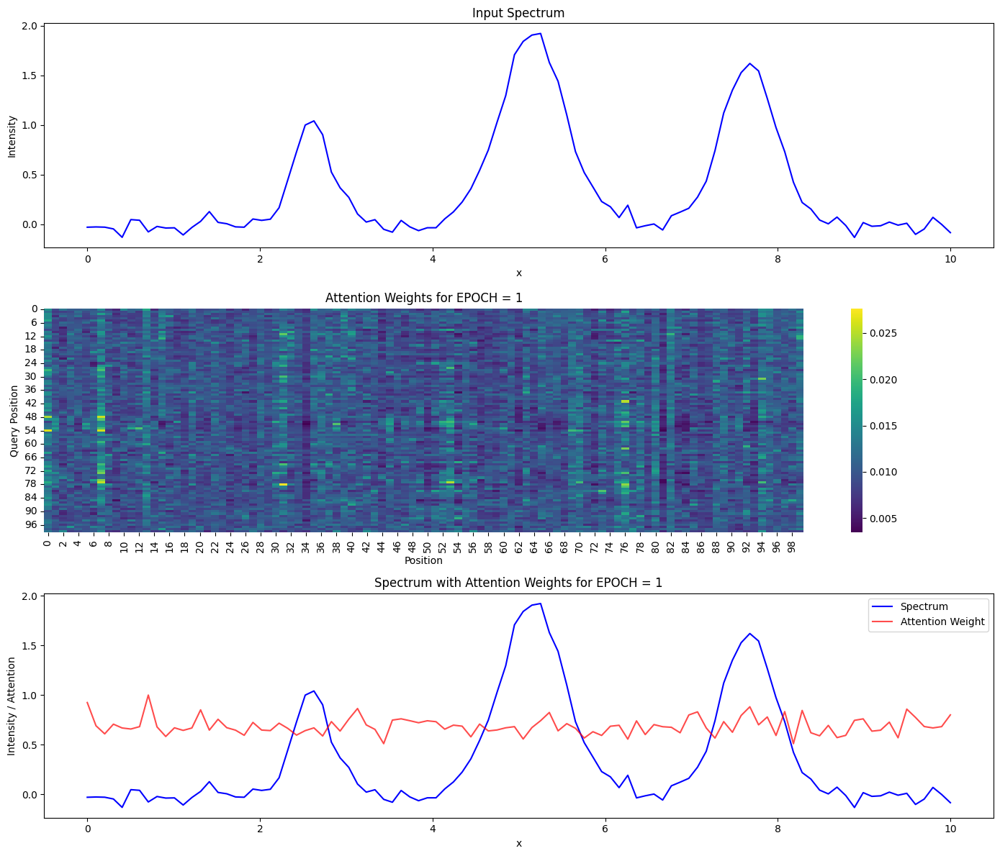

Peak positions: [2.62626263 5.25252525 7.67676768]
Attention at peaks: [0.66976845 0.7422784  0.88209796]

Epoch 2/50, Train Loss: 0.2121, Val Loss: 0.1635
Starting EPCOH = 2
Sample 1 - True A1: 1.0618
Predicted A1: 1.4090


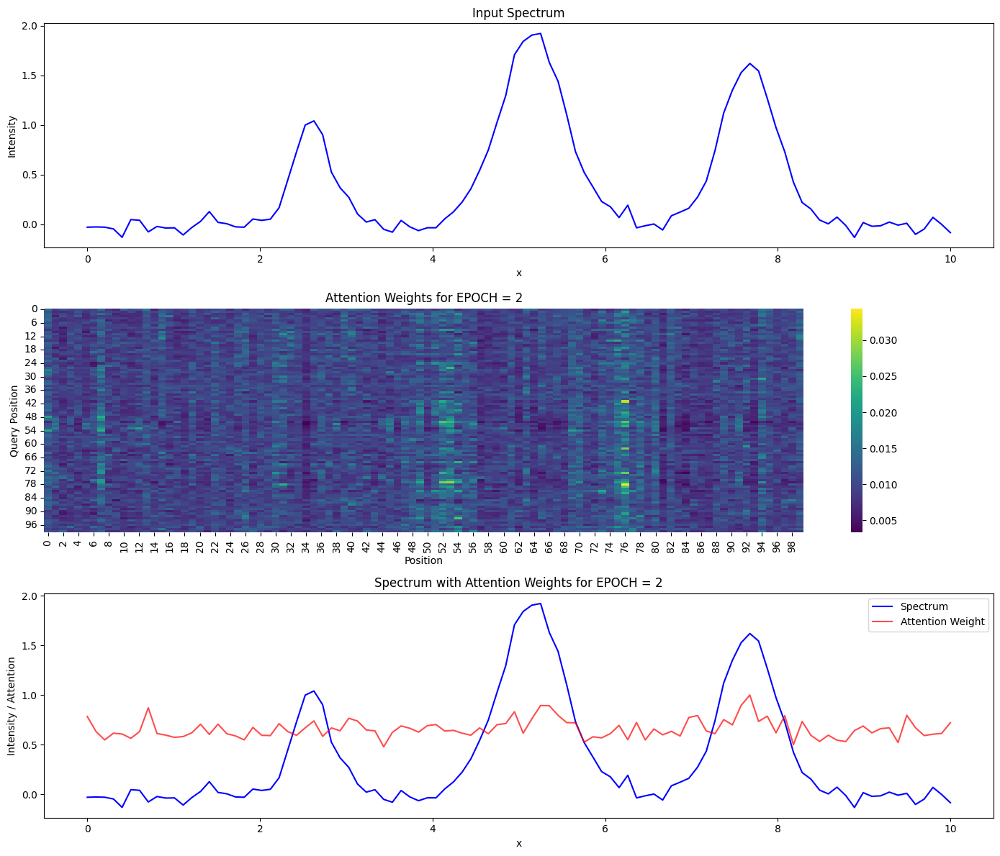

Peak positions: [2.62626263 5.25252525 7.67676768]
Attention at peaks: [0.7396253 0.8948226 1.       ]

Epoch 3/50, Train Loss: 0.1801, Val Loss: 0.1305
Starting EPCOH = 3
Sample 1 - True A1: 1.0618
Predicted A1: 1.3128


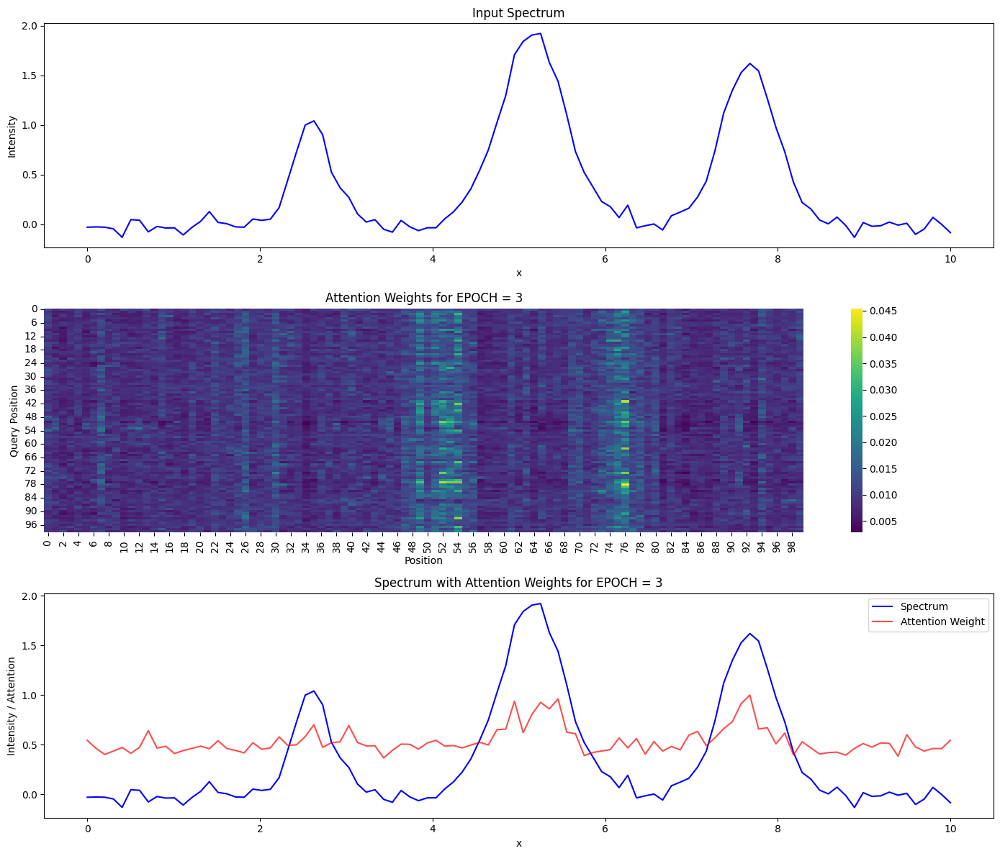

Peak positions: [2.62626263 5.25252525 7.67676768]
Attention at peaks: [0.70136005 0.92651504 1.        ]

Epoch 4/50, Train Loss: 0.1618, Val Loss: 0.1048
Starting EPCOH = 4
Sample 1 - True A1: 1.0618
Predicted A1: 1.2909


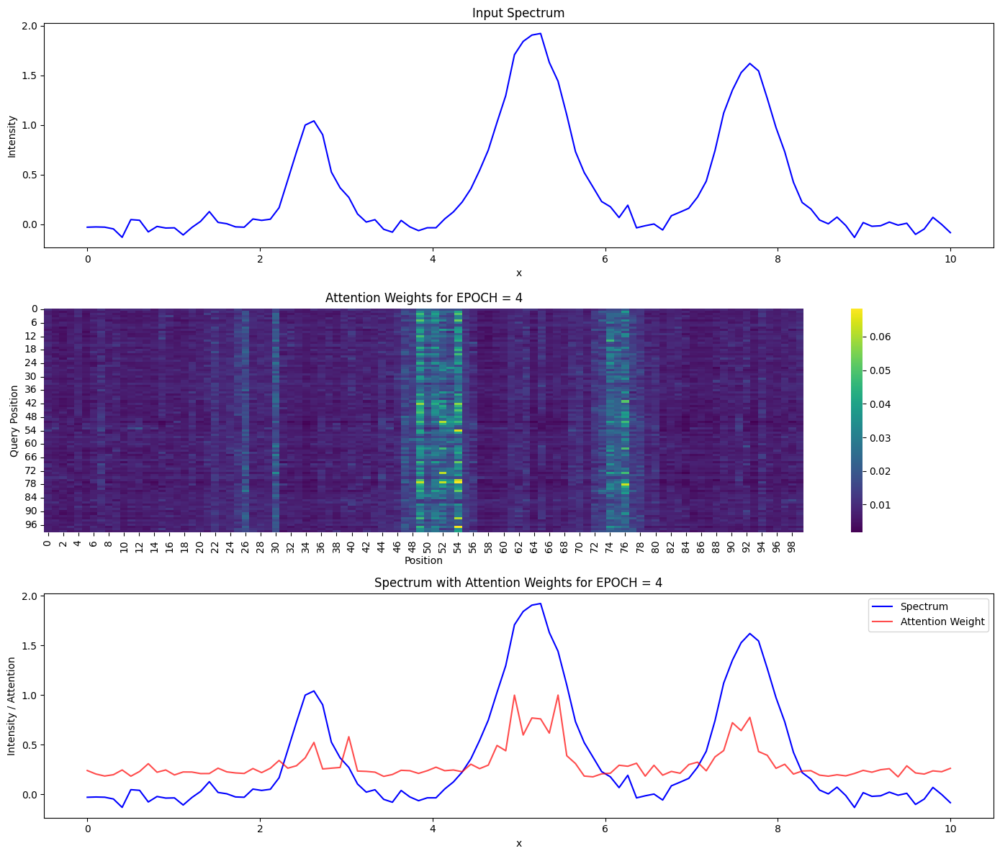

Peak positions: [2.62626263 5.25252525 7.67676768]
Attention at peaks: [0.5233153 0.7600785 0.7756176]

Epoch 5/50, Train Loss: 0.1125, Val Loss: 0.0459
Starting EPCOH = 5
Sample 1 - True A1: 1.0618
Predicted A1: 1.3272


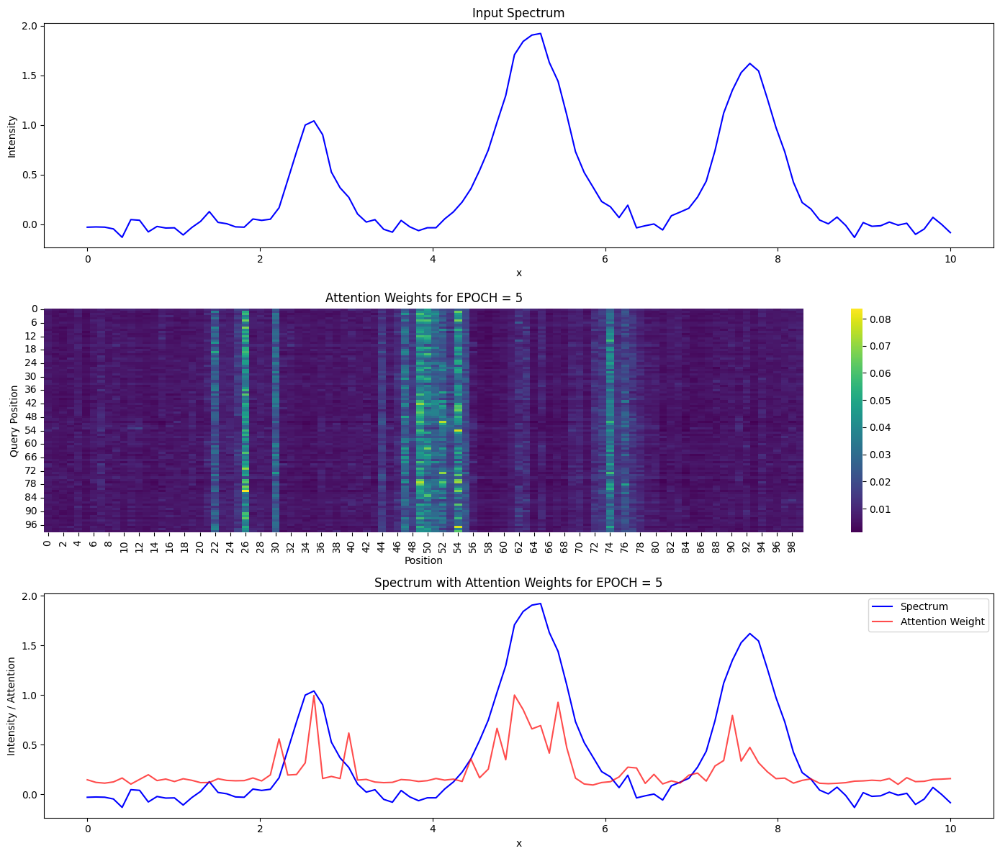

Peak positions: [2.62626263 5.25252525 7.67676768]
Attention at peaks: [0.9958727  0.69262105 0.47286978]

Epoch 6/50, Train Loss: 0.0358, Val Loss: 0.0172
Starting EPCOH = 6
Sample 1 - True A1: 1.0618
Predicted A1: 1.2297


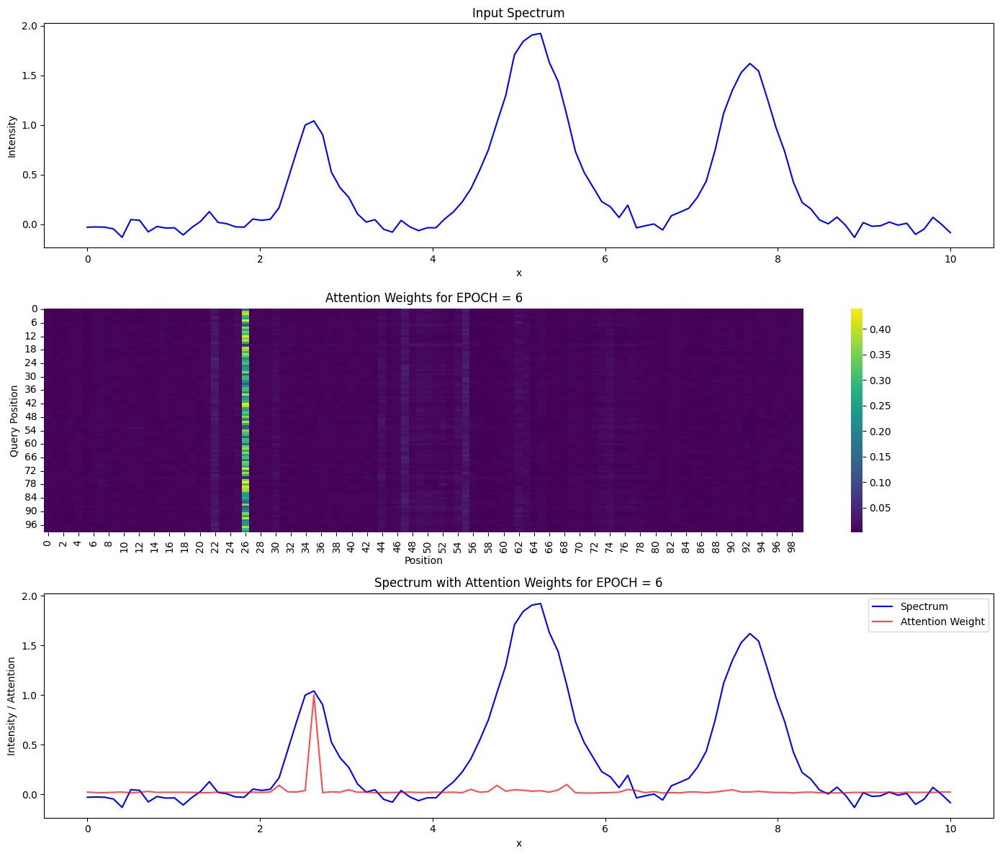

Peak positions: [2.62626263 5.25252525 7.67676768]
Attention at peaks: [1.         0.03657862 0.02430284]

Epoch 7/50, Train Loss: 0.0163, Val Loss: 0.0106
Starting EPCOH = 7
Sample 1 - True A1: 1.0618
Predicted A1: 1.1081


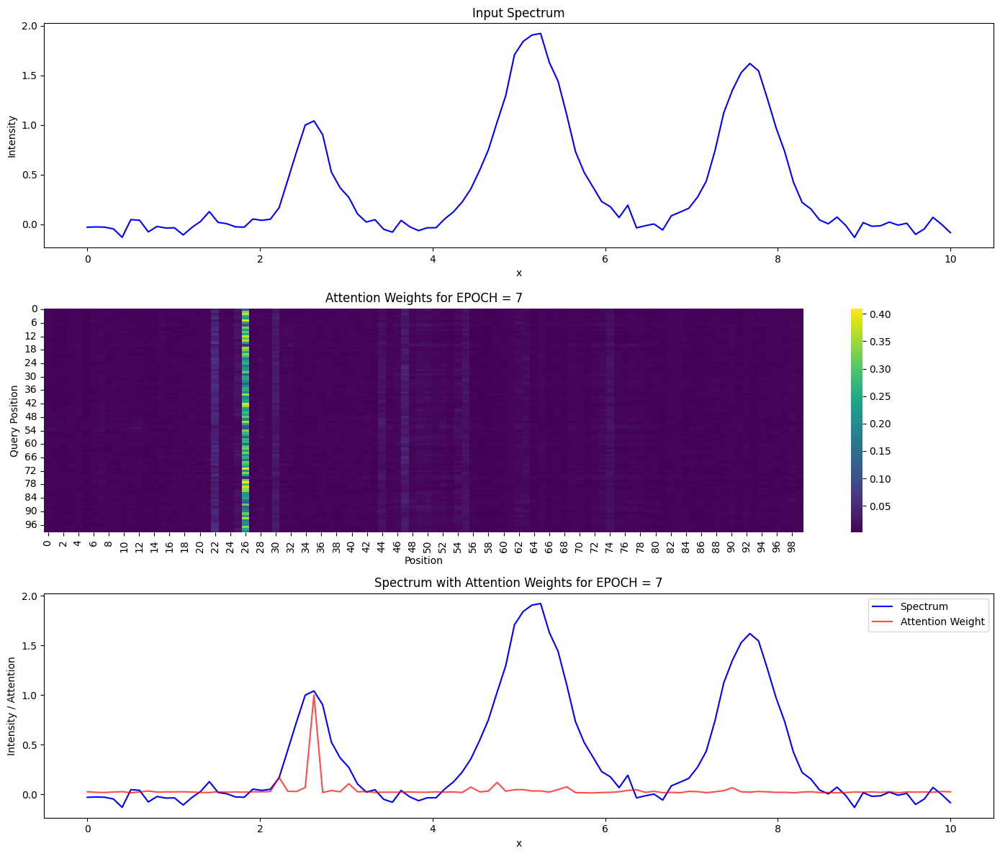

Peak positions: [2.62626263 5.25252525 7.67676768]
Attention at peaks: [1.         0.03524591 0.02287063]

Epoch 8/50, Train Loss: 0.0127, Val Loss: 0.0077
Starting EPCOH = 8
Sample 1 - True A1: 1.0618
Predicted A1: 1.1524


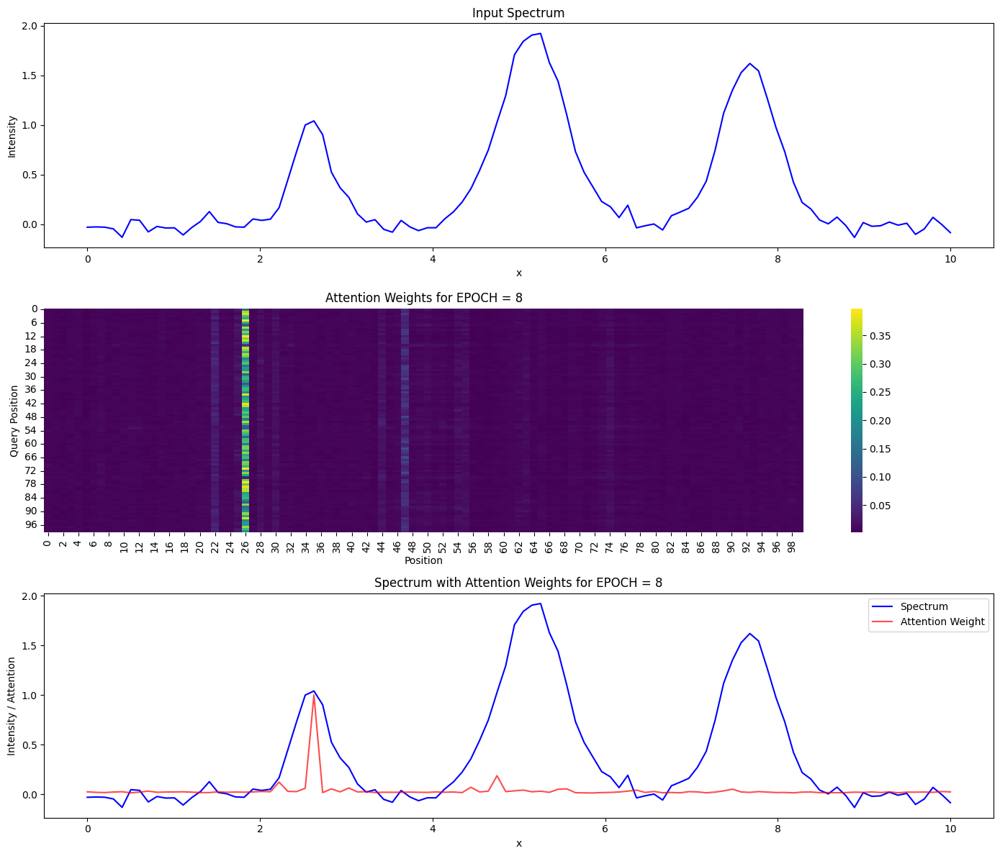

Peak positions: [2.62626263 5.25252525 7.67676768]
Attention at peaks: [1.         0.03240334 0.02042623]

Epoch 9/50, Train Loss: 0.0098, Val Loss: 0.0074
Starting EPCOH = 9
Sample 1 - True A1: 1.0618
Predicted A1: 1.0983


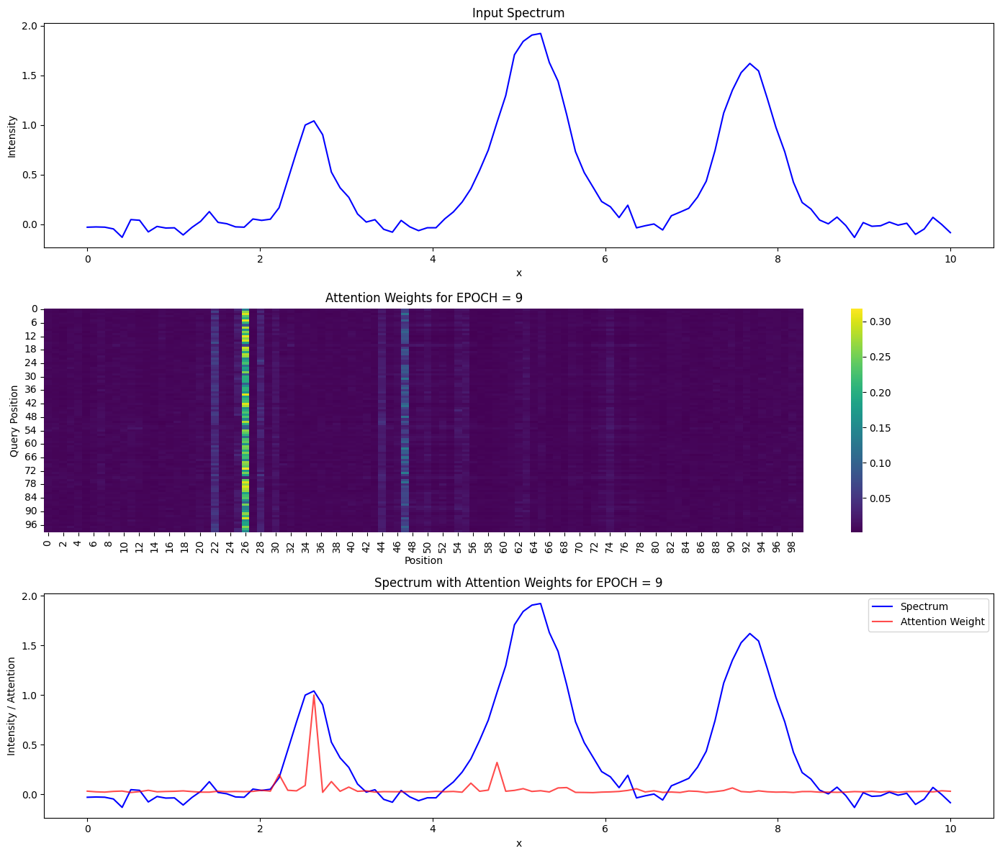

Peak positions: [2.62626263 5.25252525 7.67676768]
Attention at peaks: [1.         0.03676999 0.02307053]

Epoch 10/50, Train Loss: 0.0082, Val Loss: 0.0061
Starting EPCOH = 10
Sample 1 - True A1: 1.0618
Predicted A1: 1.0560


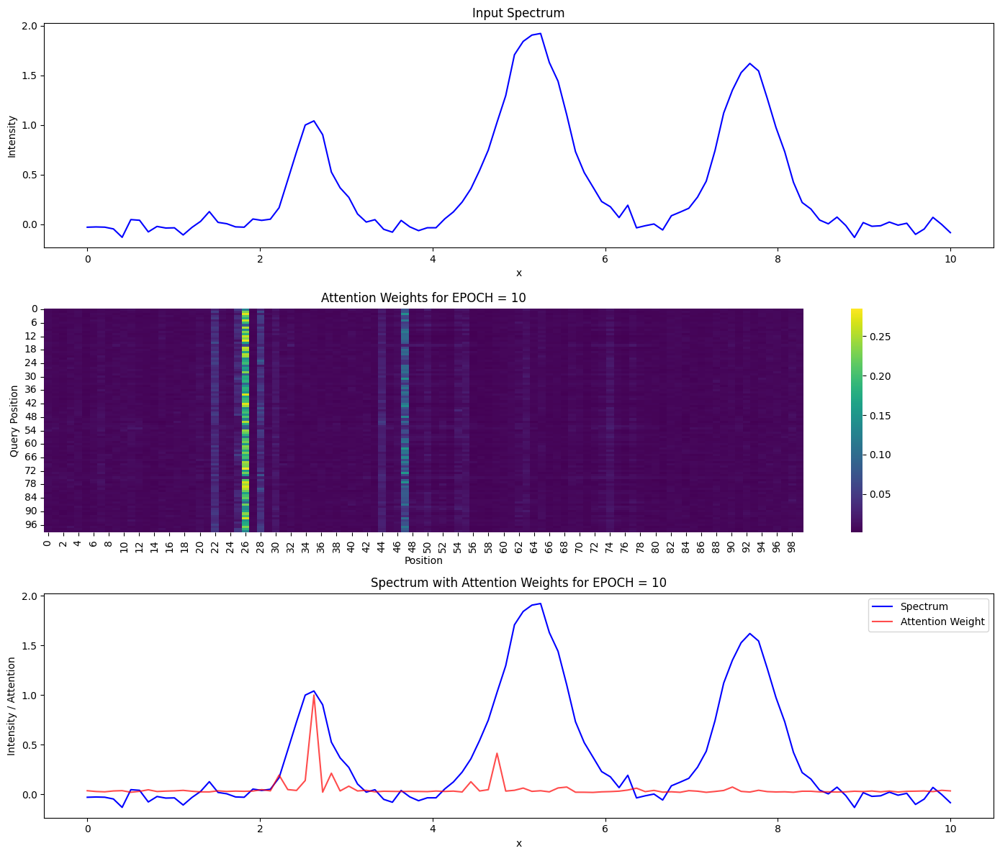

Peak positions: [2.62626263 5.25252525 7.67676768]
Attention at peaks: [1.         0.03665239 0.02364565]

Epoch 11/50, Train Loss: 0.0077, Val Loss: 0.0062
Starting EPCOH = 11
Sample 1 - True A1: 1.0618
Predicted A1: 1.0546


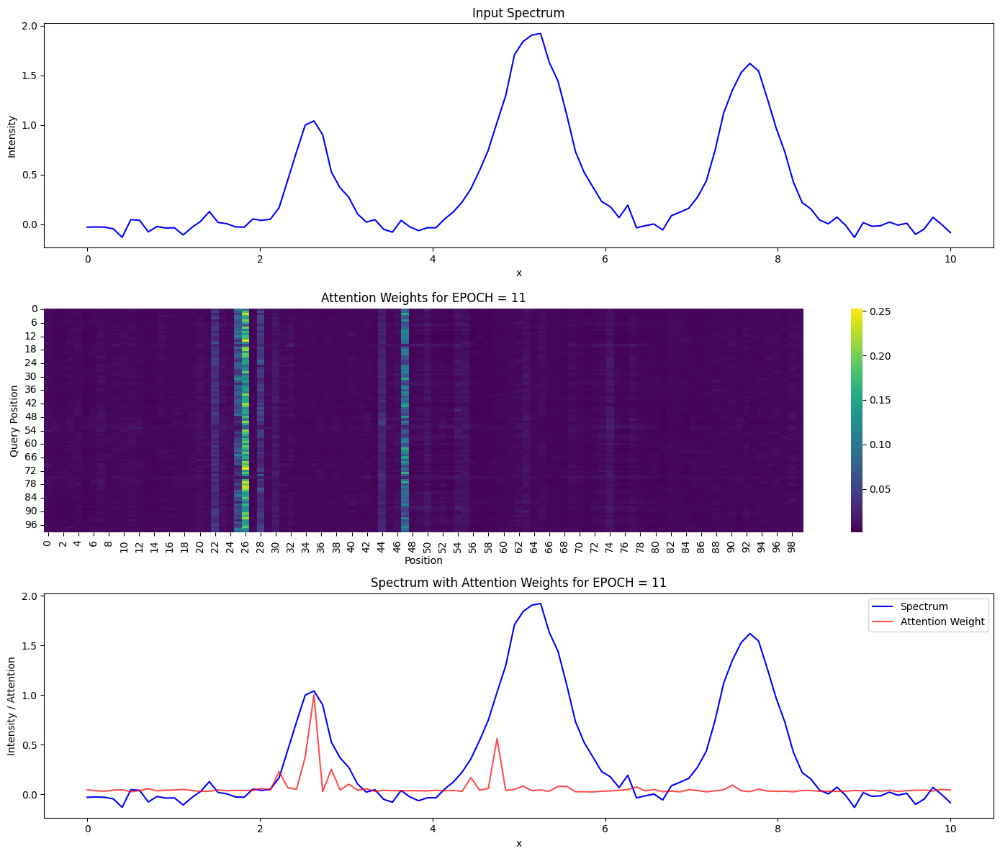

Peak positions: [2.62626263 5.25252525 7.67676768]
Attention at peaks: [1.         0.04487958 0.02824899]

Epoch 12/50, Train Loss: 0.0058, Val Loss: 0.0051
Starting EPCOH = 12
Sample 1 - True A1: 1.0618
Predicted A1: 1.0496


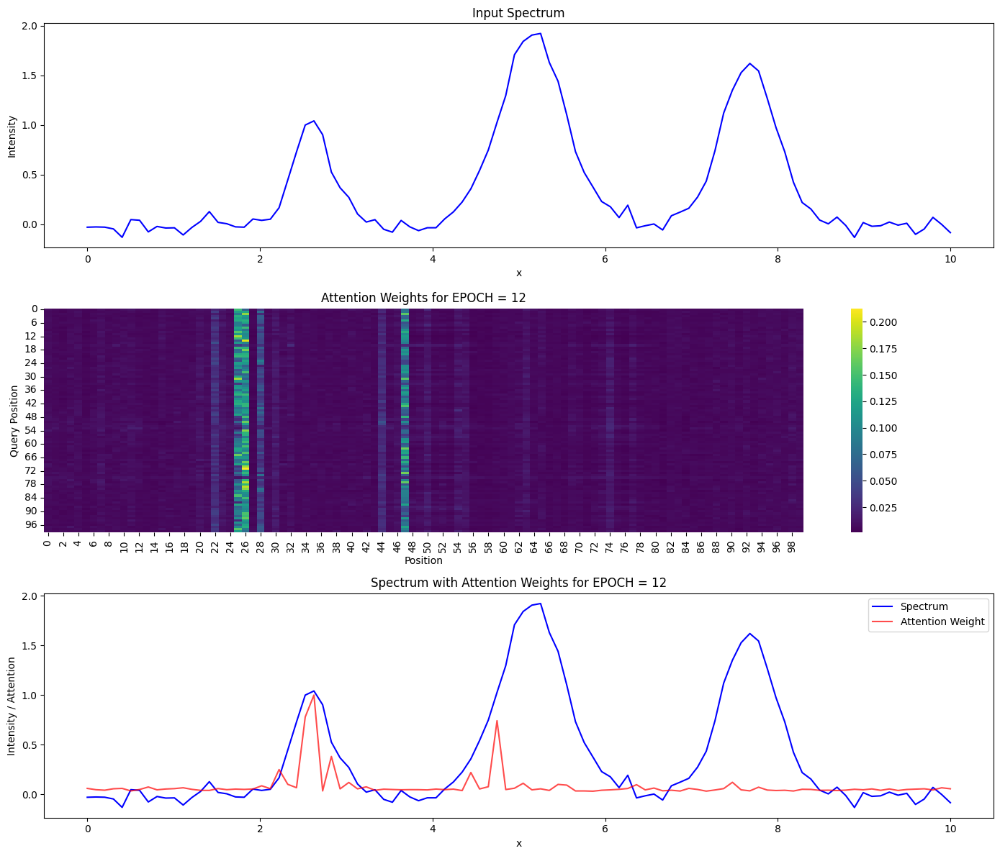

Peak positions: [2.62626263 5.25252525 7.67676768]
Attention at peaks: [1.         0.05605552 0.03561113]

Epoch 13/50, Train Loss: 0.0057, Val Loss: 0.0037
Starting EPCOH = 13
Sample 1 - True A1: 1.0618
Predicted A1: 1.0055


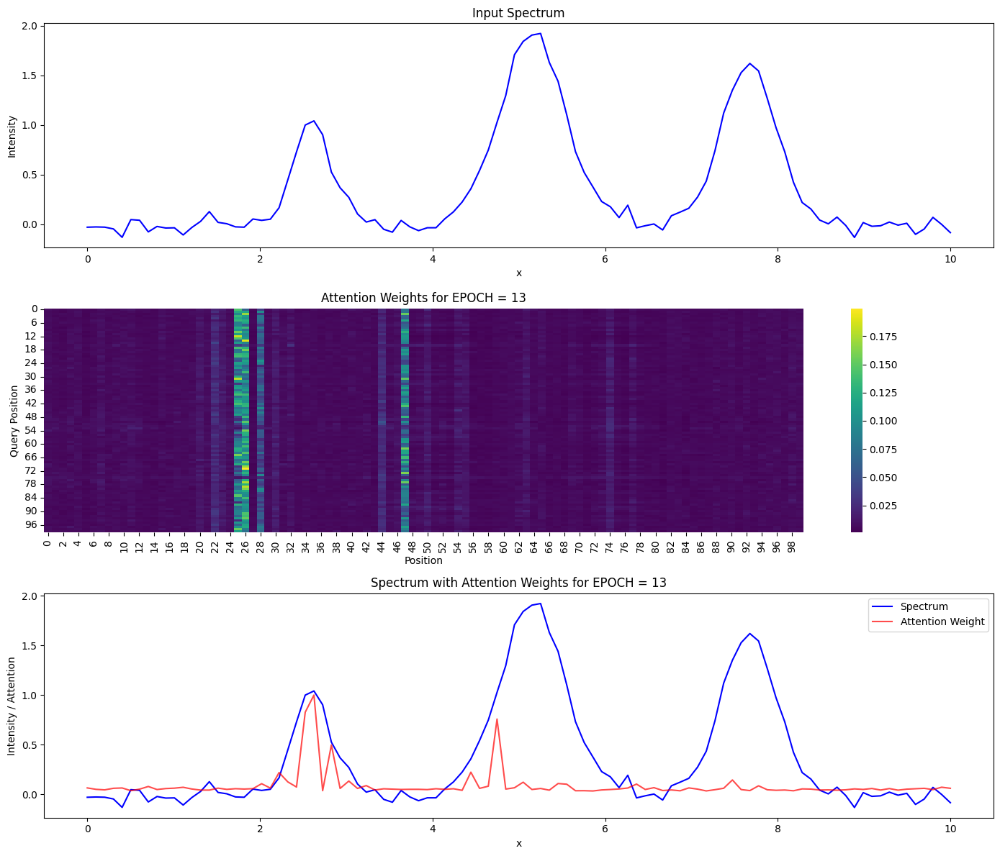

Peak positions: [2.62626263 5.25252525 7.67676768]
Attention at peaks: [1.         0.05951377 0.03811283]

Epoch 14/50, Train Loss: 0.0049, Val Loss: 0.0035
Starting EPCOH = 14
Sample 1 - True A1: 1.0618
Predicted A1: 1.0219


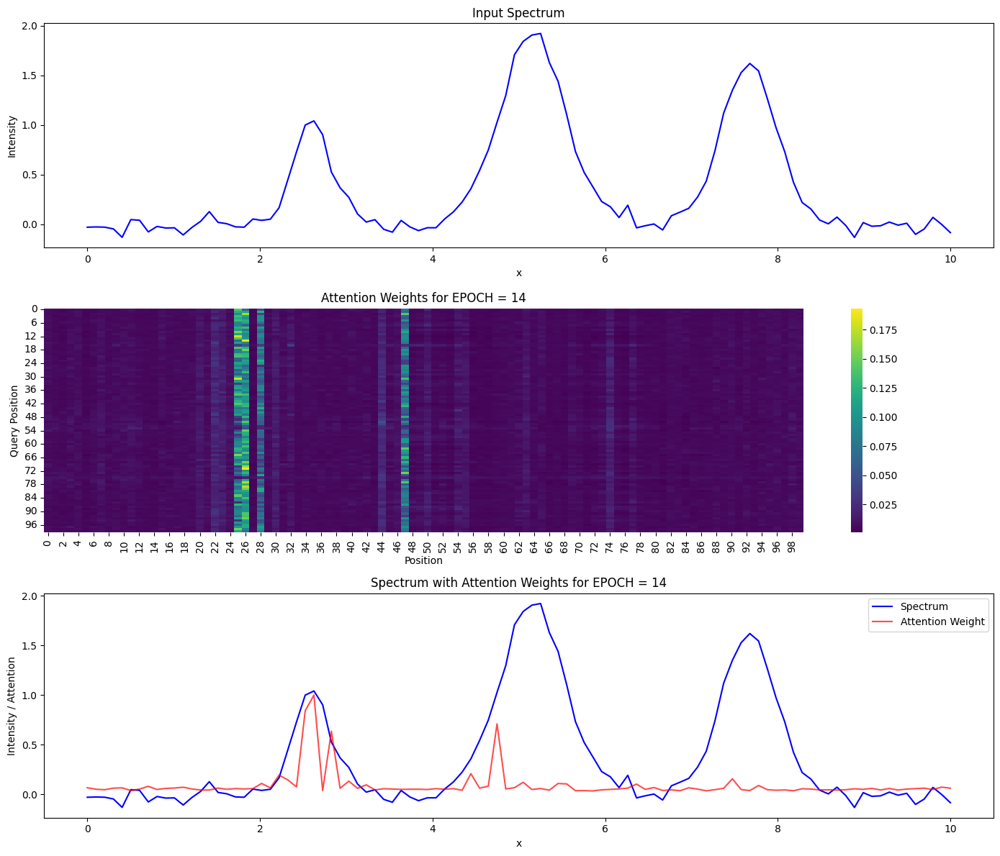

Peak positions: [2.62626263 5.25252525 7.67676768]
Attention at peaks: [1.         0.05902396 0.03834851]

Epoch 15/50, Train Loss: 0.0047, Val Loss: 0.0038
Starting EPCOH = 15
Sample 1 - True A1: 1.0618
Predicted A1: 1.0229


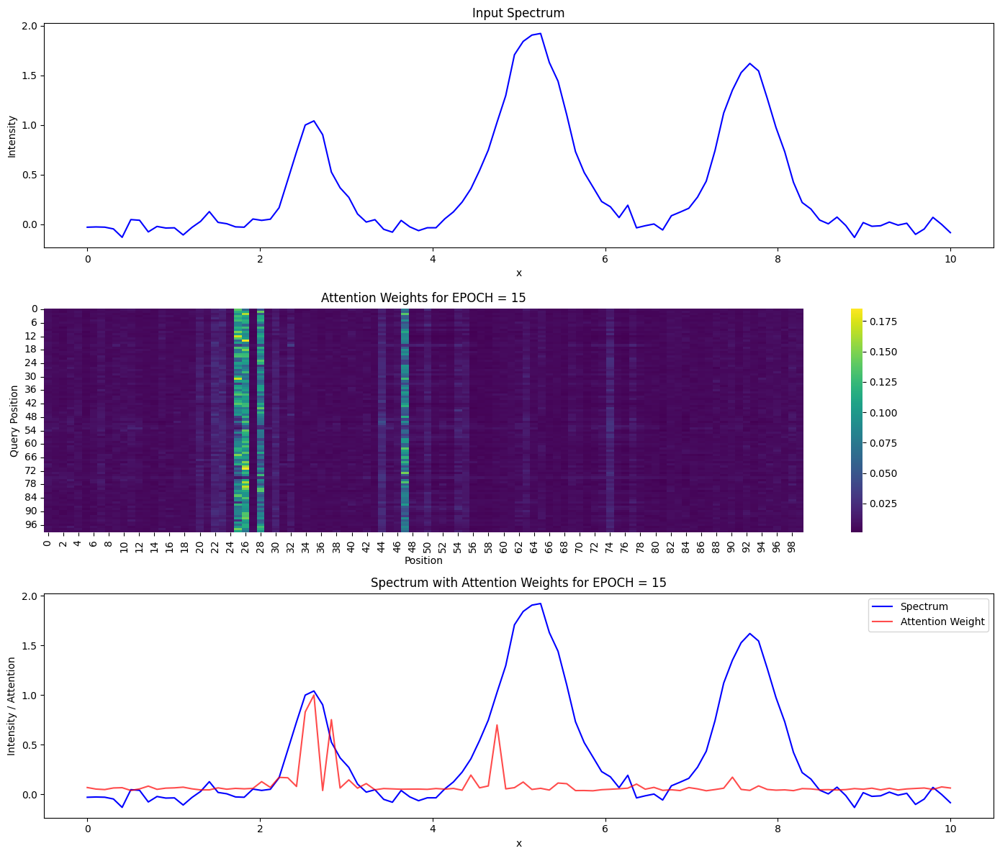

Peak positions: [2.62626263 5.25252525 7.67676768]
Attention at peaks: [1.         0.06120802 0.04020473]

Epoch 16/50, Train Loss: 0.0039, Val Loss: 0.0047
Starting EPCOH = 16
Sample 1 - True A1: 1.0618
Predicted A1: 1.0308


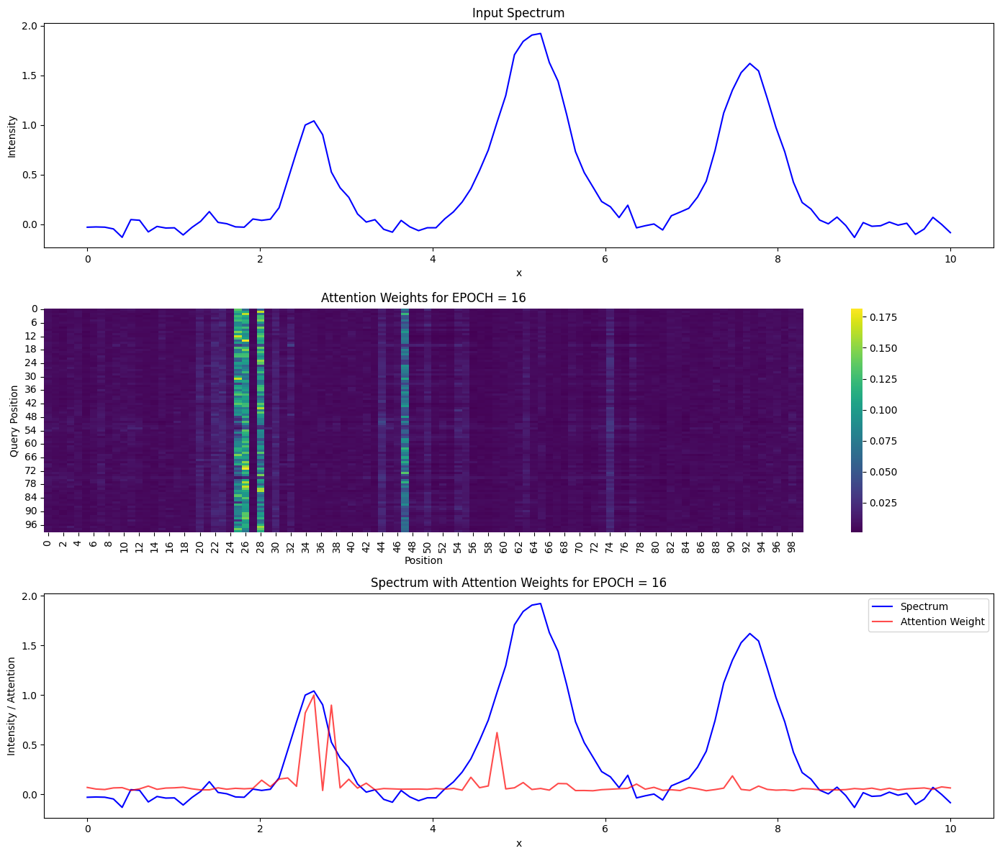

Peak positions: [2.62626263 5.25252525 7.67676768]
Attention at peaks: [1.         0.05970501 0.04071924]

Epoch 17/50, Train Loss: 0.0039, Val Loss: 0.0027
Starting EPCOH = 17
Sample 1 - True A1: 1.0618
Predicted A1: 1.0252


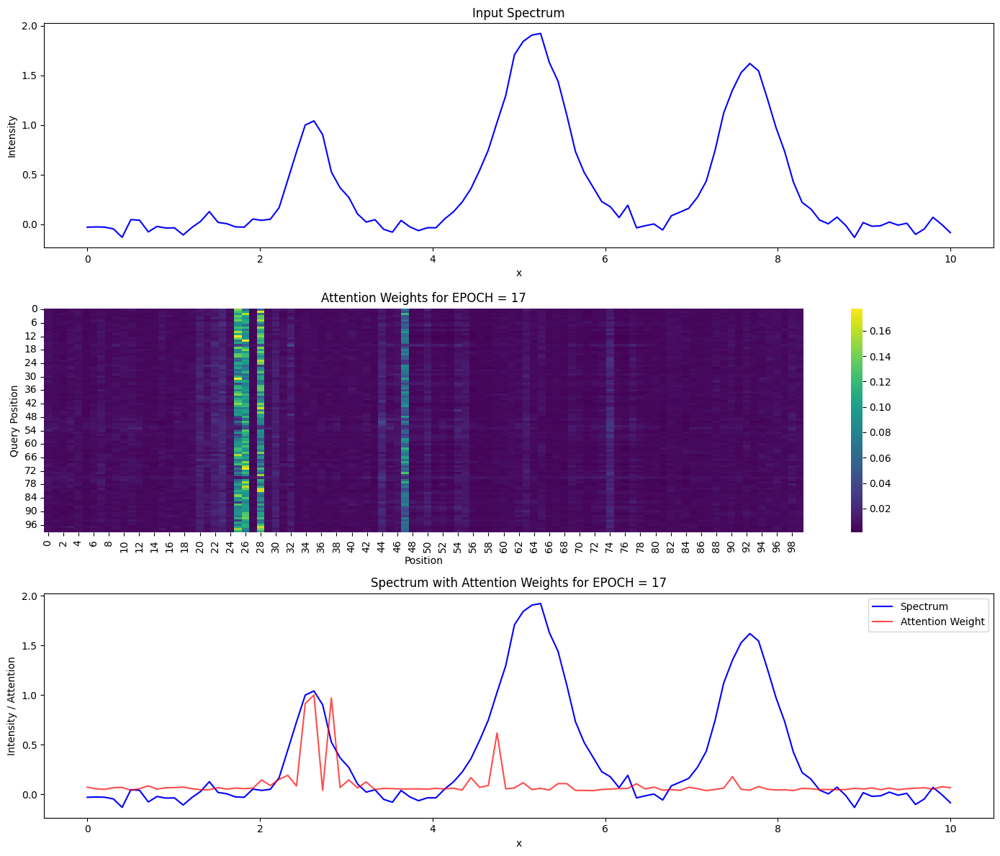

Peak positions: [2.62626263 5.25252525 7.67676768]
Attention at peaks: [1.         0.06116793 0.04225211]

Epoch 18/50, Train Loss: 0.0033, Val Loss: 0.0065
Starting EPCOH = 18
Sample 1 - True A1: 1.0618
Predicted A1: 1.0556


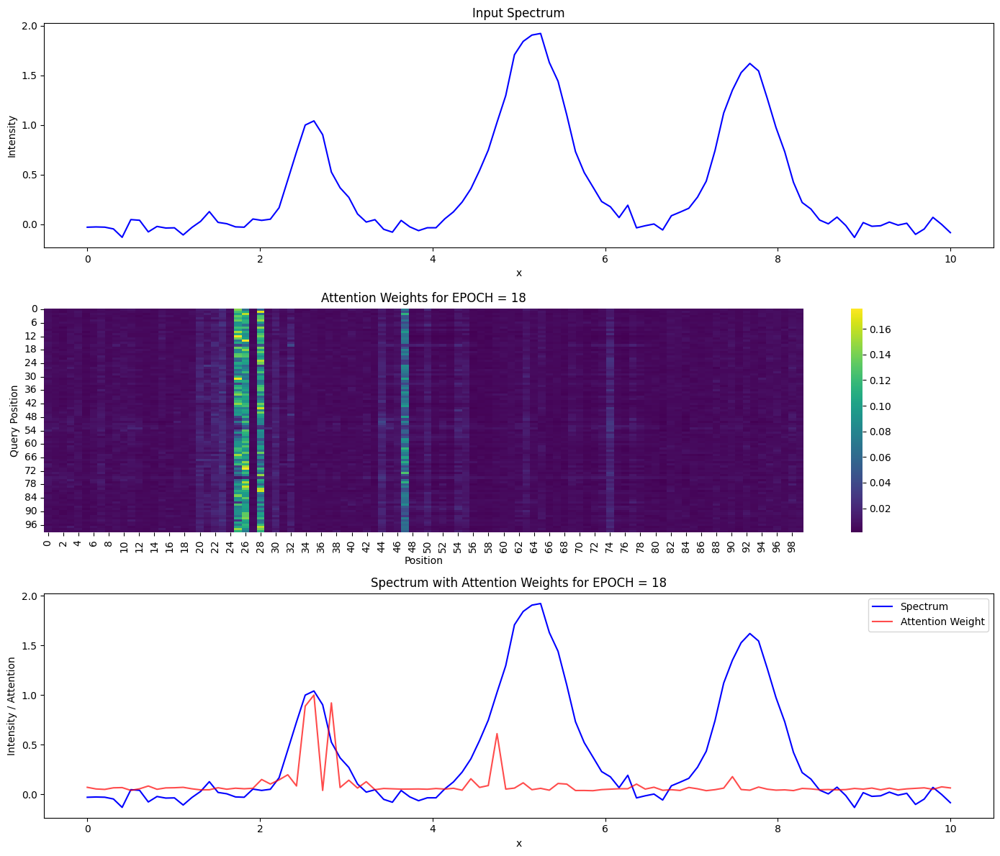

Peak positions: [2.62626263 5.25252525 7.67676768]
Attention at peaks: [1.         0.0608812  0.04213584]

Epoch 19/50, Train Loss: 0.0044, Val Loss: 0.0049
Starting EPCOH = 19
Sample 1 - True A1: 1.0618
Predicted A1: 1.0188


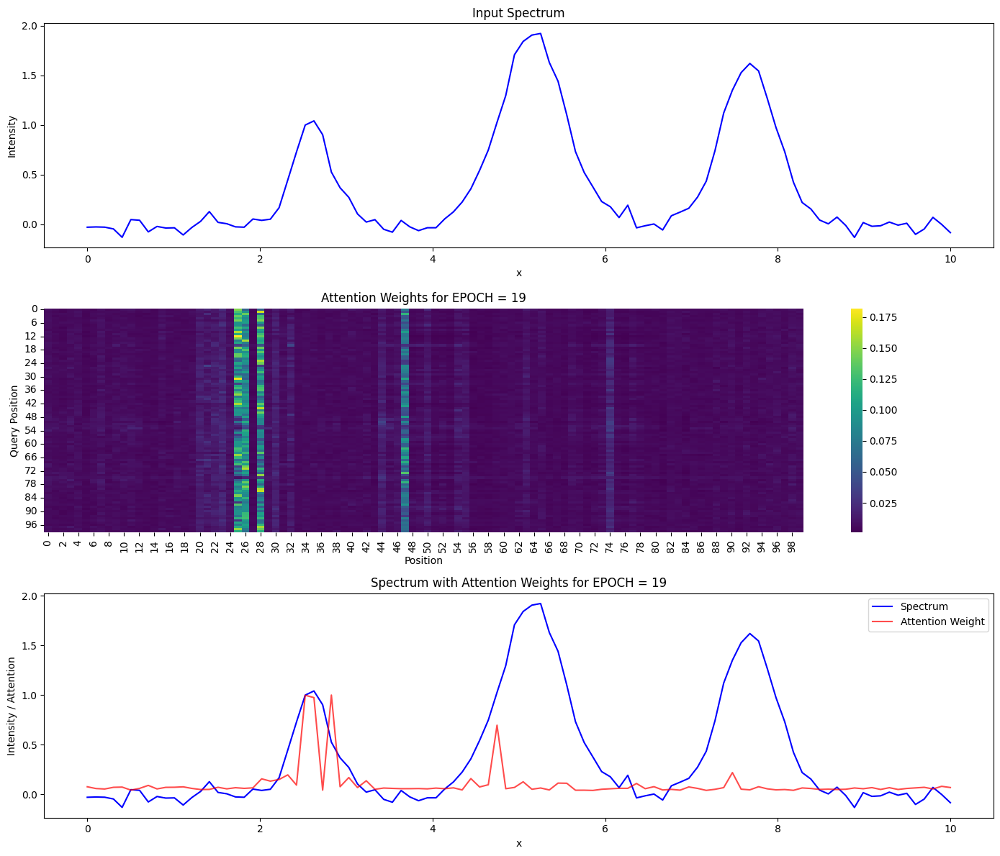

Peak positions: [2.62626263 5.25252525 7.67676768]
Attention at peaks: [0.97453046 0.06438227 0.04583549]

Epoch 20/50, Train Loss: 0.0031, Val Loss: 0.0035
Starting EPCOH = 20
Sample 1 - True A1: 1.0618
Predicted A1: 1.0189


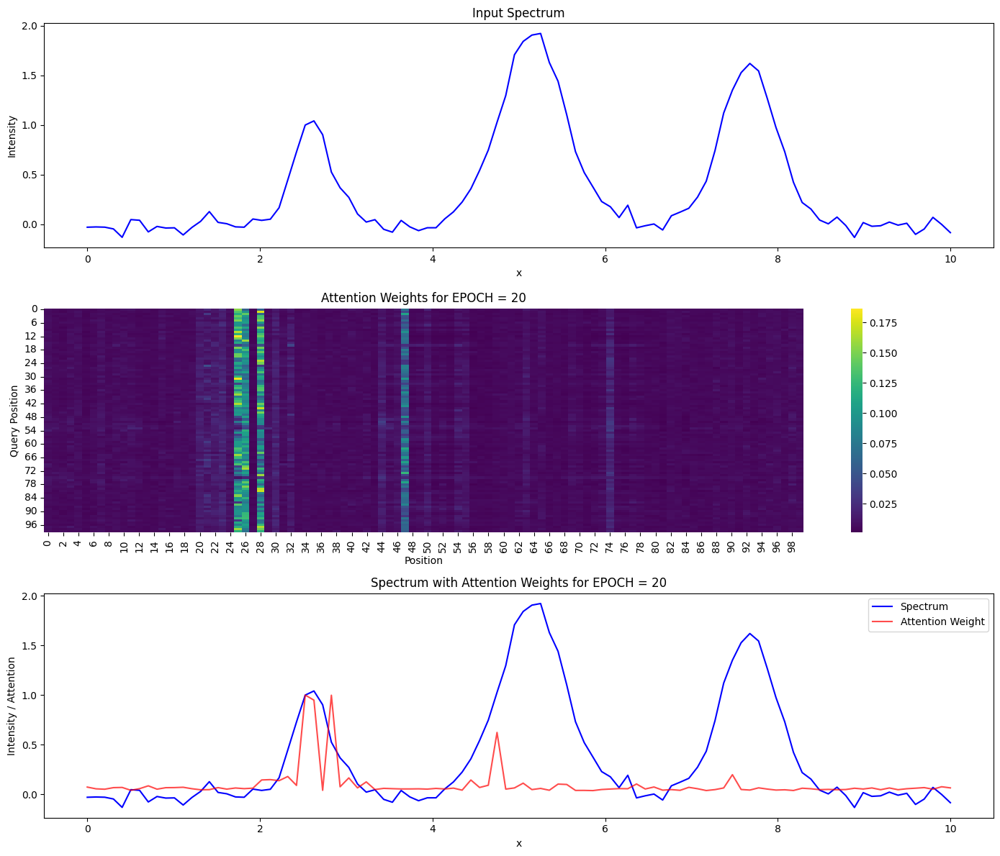

Peak positions: [2.62626263 5.25252525 7.67676768]
Attention at peaks: [0.948886   0.06010868 0.04354893]

Epoch 21/50, Train Loss: 0.0029, Val Loss: 0.0027
Starting EPCOH = 21
Sample 1 - True A1: 1.0618
Predicted A1: 1.0201


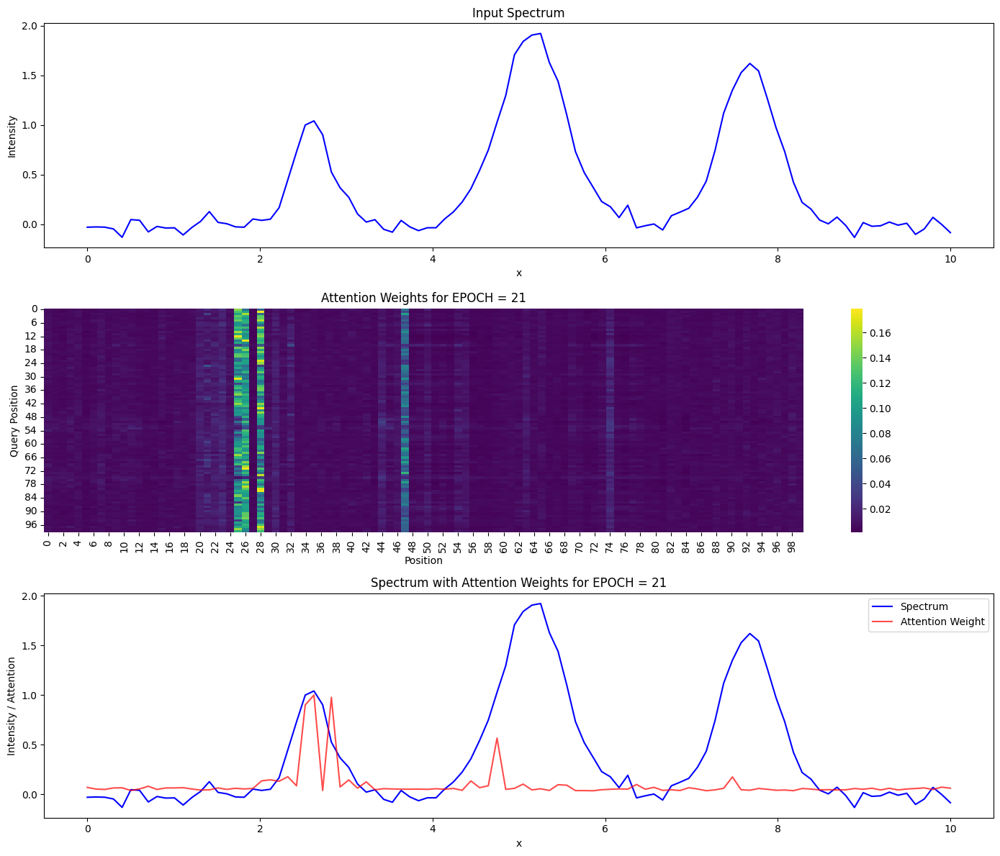

Peak positions: [2.62626263 5.25252525 7.67676768]
Attention at peaks: [1.         0.05671237 0.0414143 ]

Epoch 22/50, Train Loss: 0.0029, Val Loss: 0.0022
Starting EPCOH = 22
Sample 1 - True A1: 1.0618
Predicted A1: 0.9764


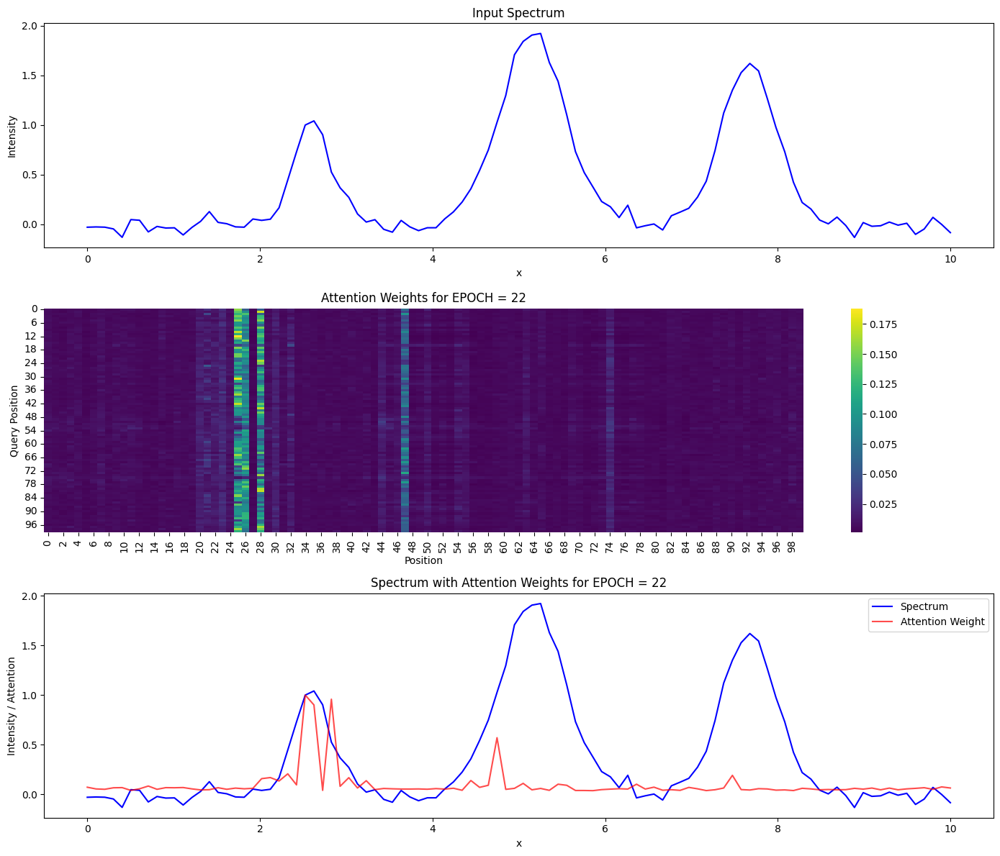

Peak positions: [2.62626263 5.25252525 7.67676768]
Attention at peaks: [0.900779   0.05993203 0.04379714]

Epoch 23/50, Train Loss: 0.0027, Val Loss: 0.0020
Starting EPCOH = 23
Sample 1 - True A1: 1.0618
Predicted A1: 1.0028


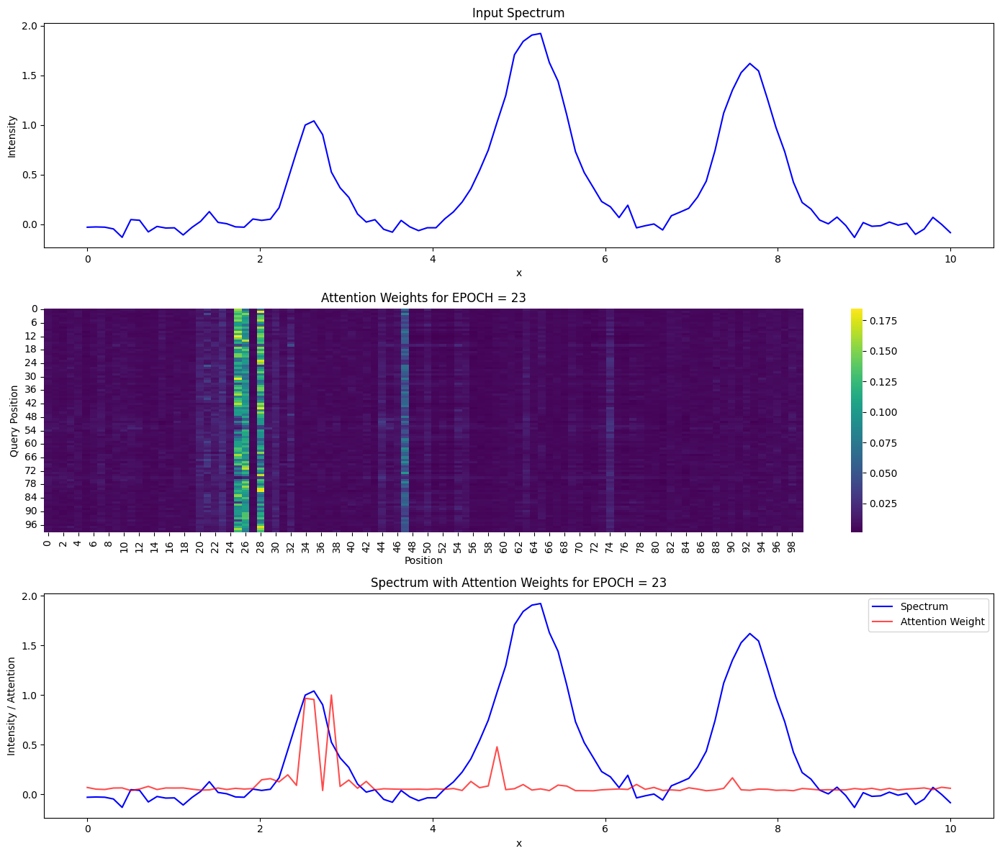

Peak positions: [2.62626263 5.25252525 7.67676768]
Attention at peaks: [0.95567006 0.0557324  0.04146508]

Epoch 24/50, Train Loss: 0.0025, Val Loss: 0.0036
Starting EPCOH = 24
Sample 1 - True A1: 1.0618
Predicted A1: 1.0243


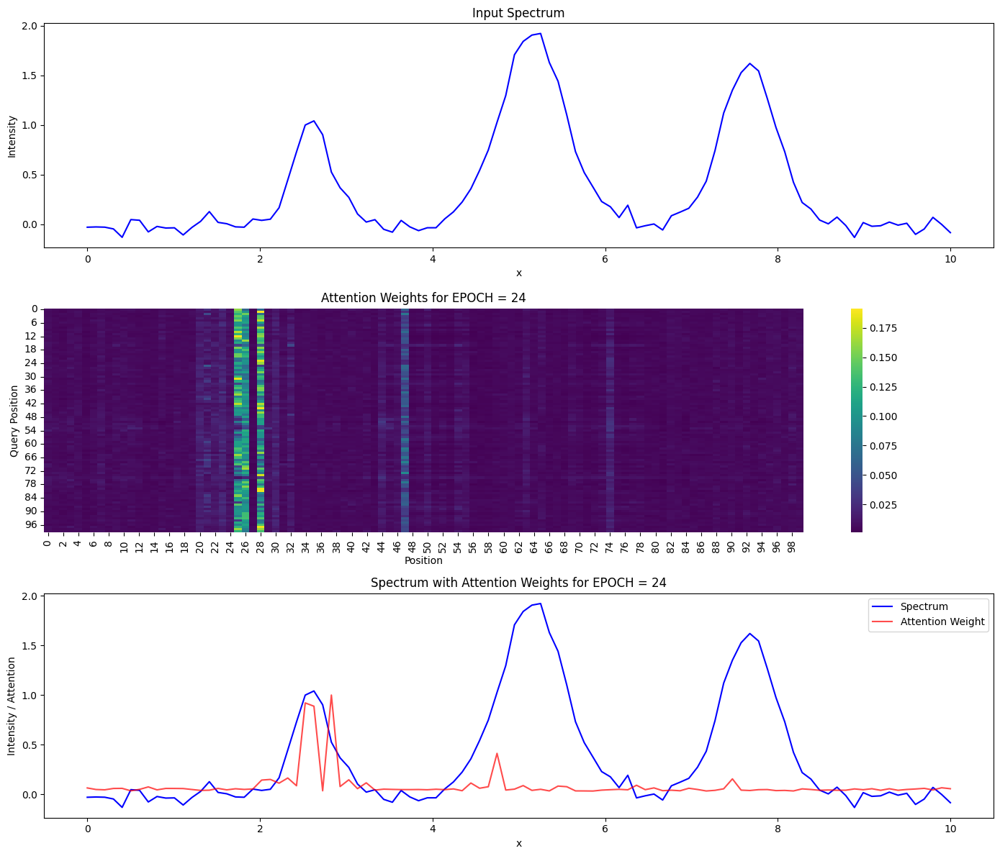

Peak positions: [2.62626263 5.25252525 7.67676768]
Attention at peaks: [0.8876632  0.05125333 0.03898426]

Epoch 25/50, Train Loss: 0.0032, Val Loss: 0.0049
Starting EPCOH = 25
Sample 1 - True A1: 1.0618
Predicted A1: 1.0614


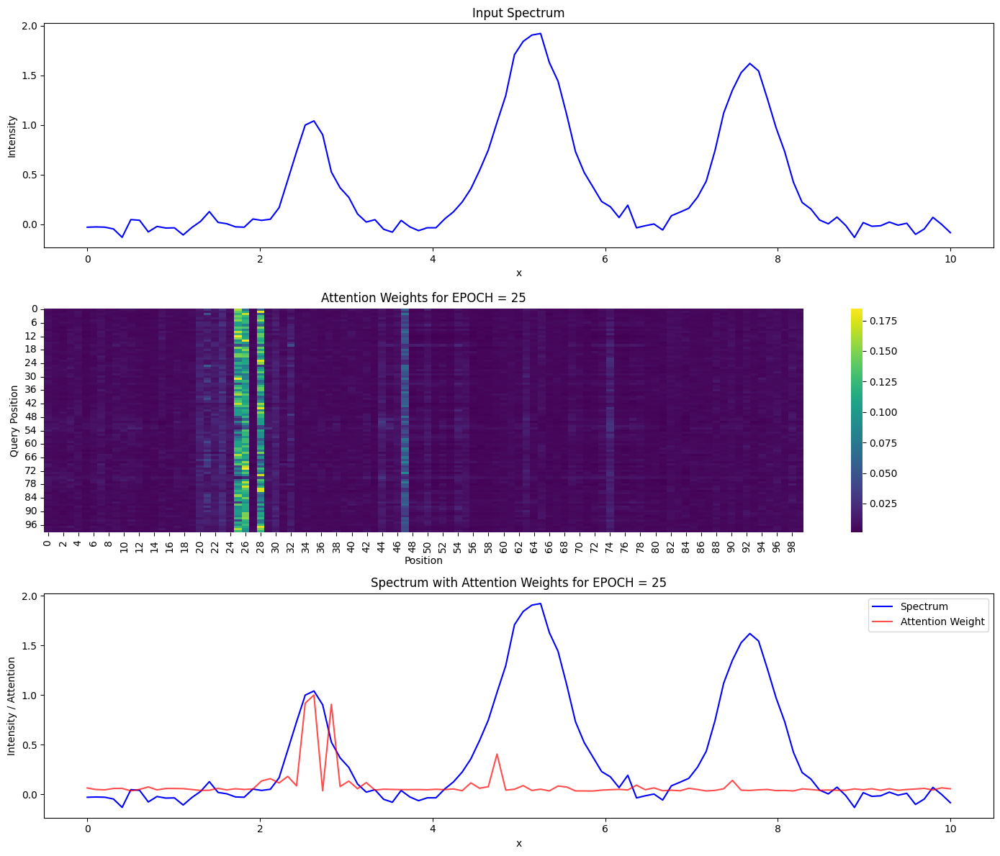

Peak positions: [2.62626263 5.25252525 7.67676768]
Attention at peaks: [1.         0.05228142 0.0394343 ]

Epoch 26/50, Train Loss: 0.0029, Val Loss: 0.0022
Starting EPCOH = 26
Sample 1 - True A1: 1.0618
Predicted A1: 1.0112


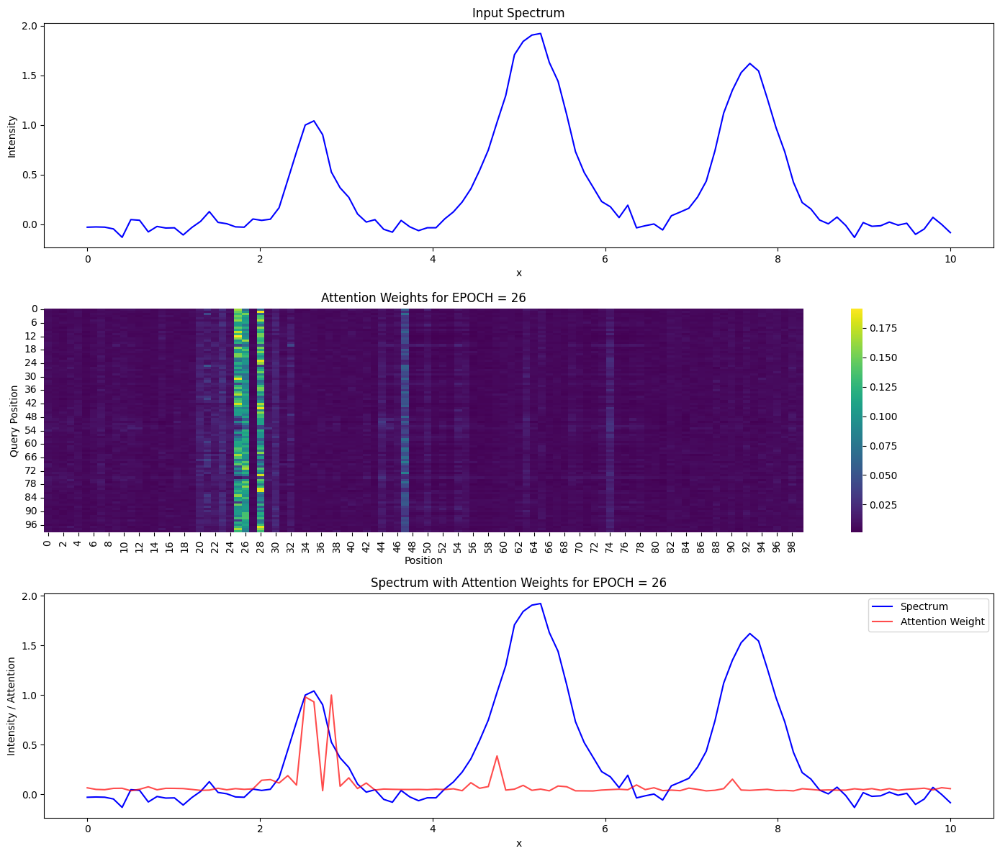

Peak positions: [2.62626263 5.25252525 7.67676768]
Attention at peaks: [0.9314243  0.05309645 0.04045965]

Epoch 27/50, Train Loss: 0.0025, Val Loss: 0.0017
Starting EPCOH = 27
Sample 1 - True A1: 1.0618
Predicted A1: 1.0126


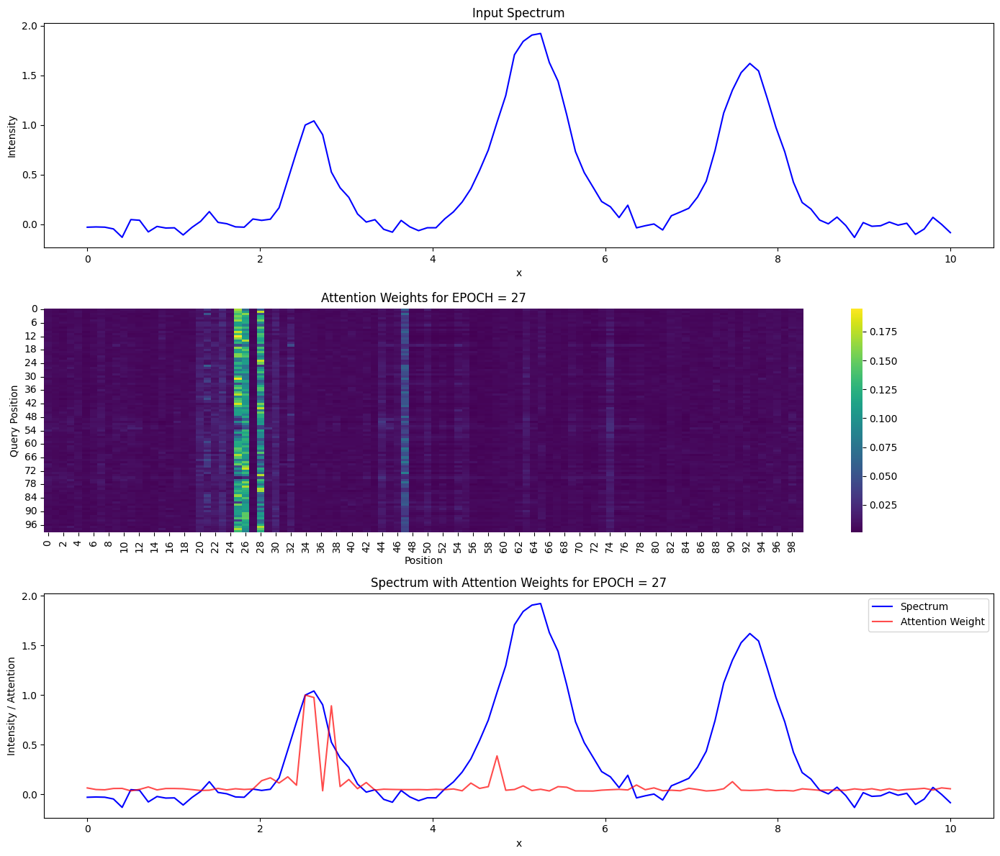

Peak positions: [2.62626263 5.25252525 7.67676768]
Attention at peaks: [0.97560966 0.05170389 0.03974187]

Epoch 28/50, Train Loss: 0.0023, Val Loss: 0.0016
Starting EPCOH = 28
Sample 1 - True A1: 1.0618
Predicted A1: 0.9979


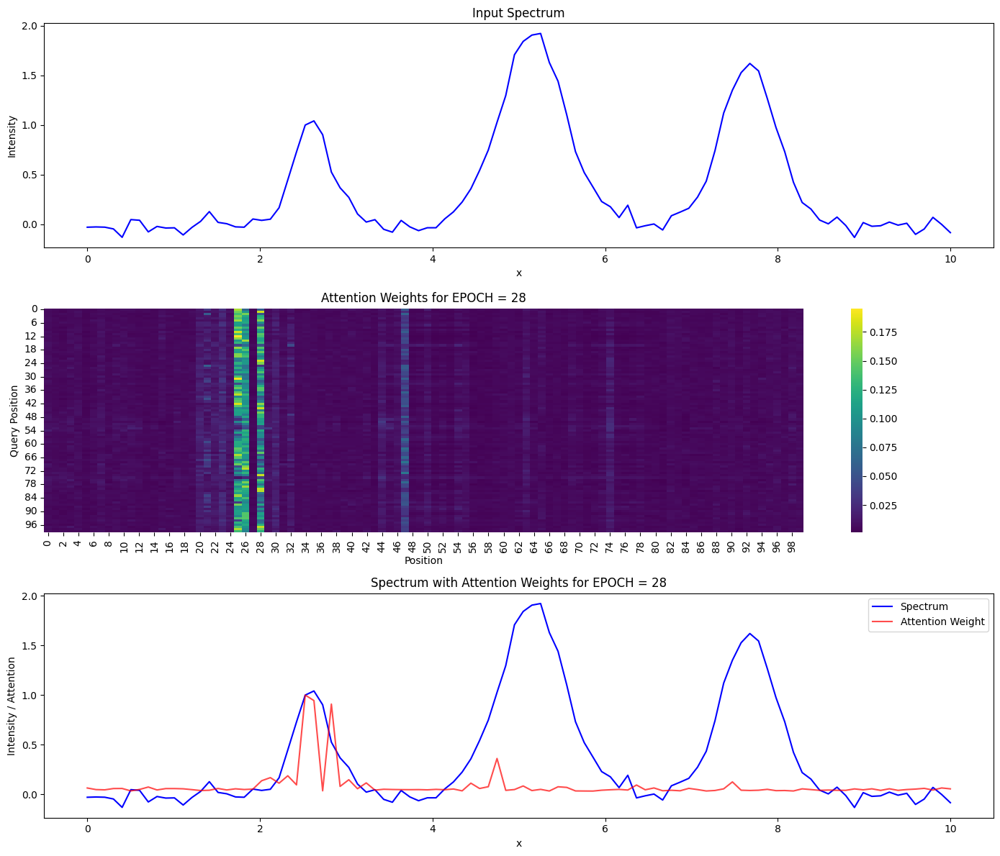

Peak positions: [2.62626263 5.25252525 7.67676768]
Attention at peaks: [0.94452536 0.0506131  0.0393052 ]

Epoch 29/50, Train Loss: 0.0022, Val Loss: 0.0018
Starting EPCOH = 29
Sample 1 - True A1: 1.0618
Predicted A1: 1.0092


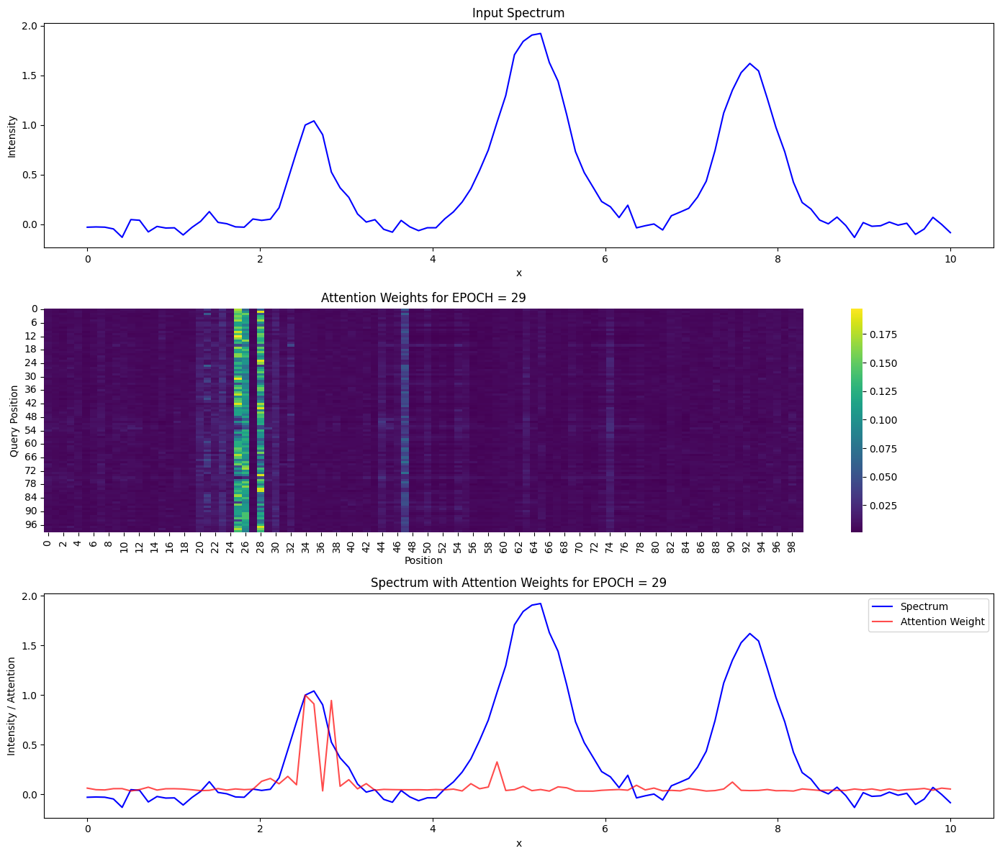

Peak positions: [2.62626263 5.25252525 7.67676768]
Attention at peaks: [0.91103    0.04897621 0.03821455]

Epoch 30/50, Train Loss: 0.0021, Val Loss: 0.0025
Starting EPCOH = 30
Sample 1 - True A1: 1.0618
Predicted A1: 1.0357


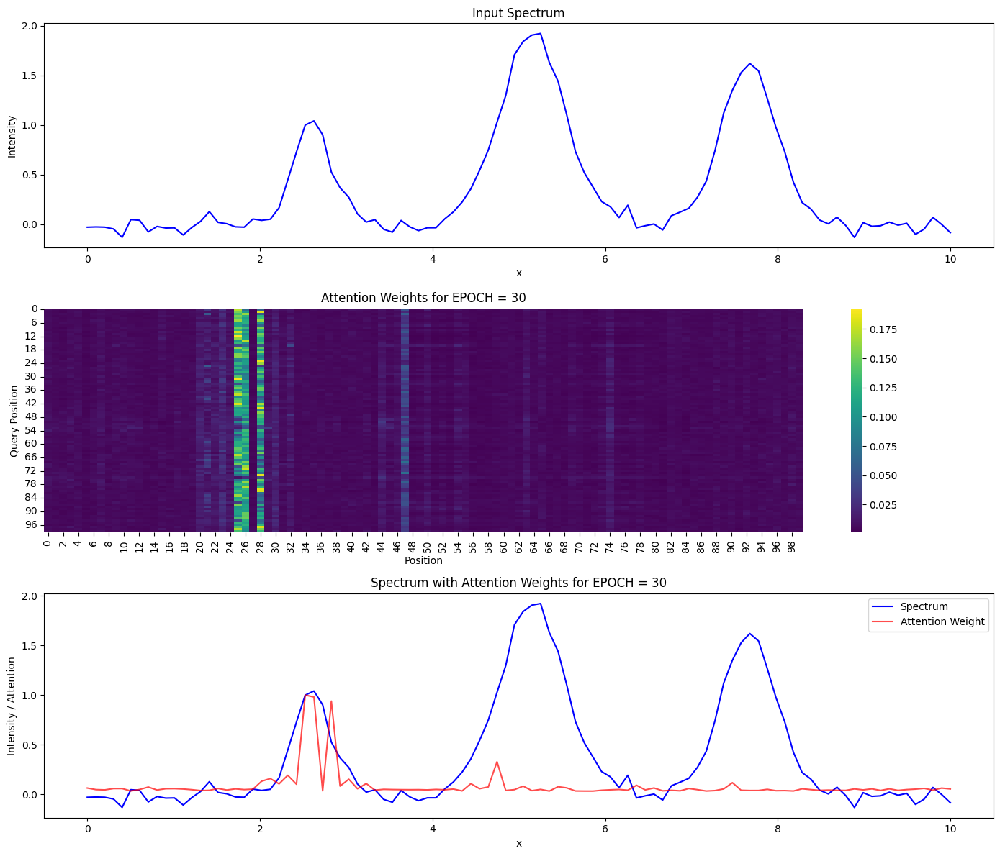

Peak positions: [2.62626263 5.25252525 7.67676768]
Attention at peaks: [0.9808687  0.05038315 0.03935338]

Epoch 31/50, Train Loss: 0.0020, Val Loss: 0.0019
Starting EPCOH = 31
Sample 1 - True A1: 1.0618
Predicted A1: 1.0150


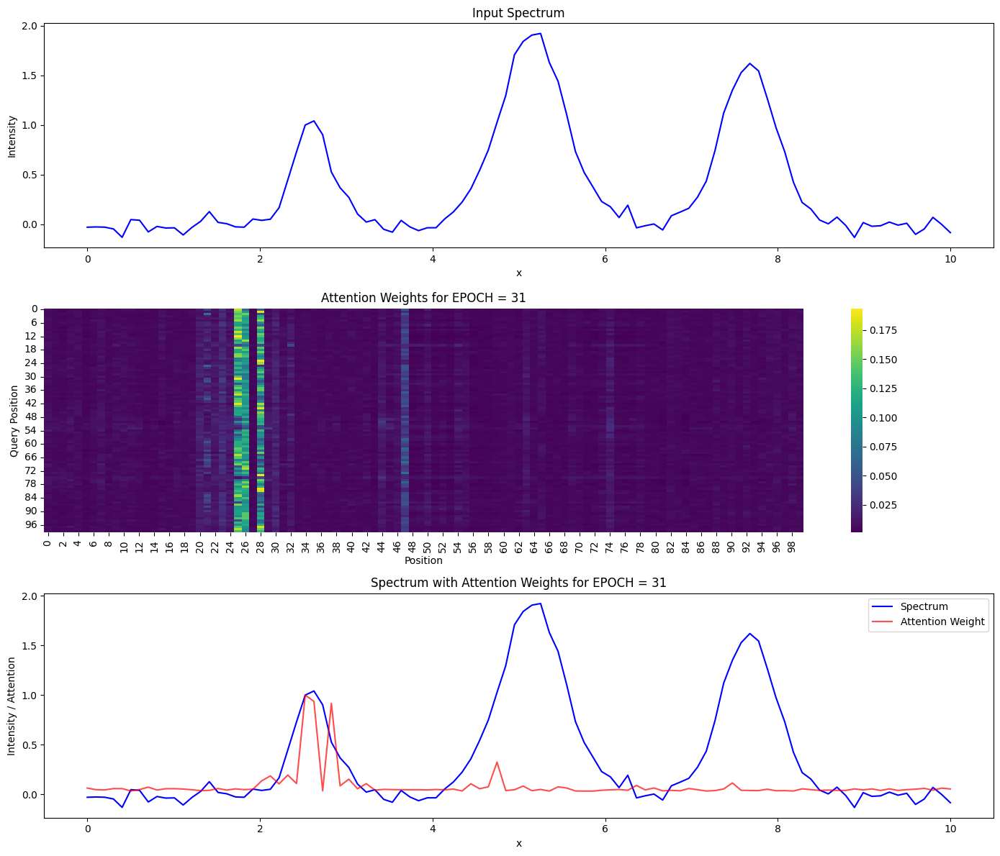

Peak positions: [2.62626263 5.25252525 7.67676768]
Attention at peaks: [0.9361253  0.05016477 0.03960108]

Epoch 32/50, Train Loss: 0.0020, Val Loss: 0.0019
Starting EPCOH = 32
Sample 1 - True A1: 1.0618
Predicted A1: 0.9954


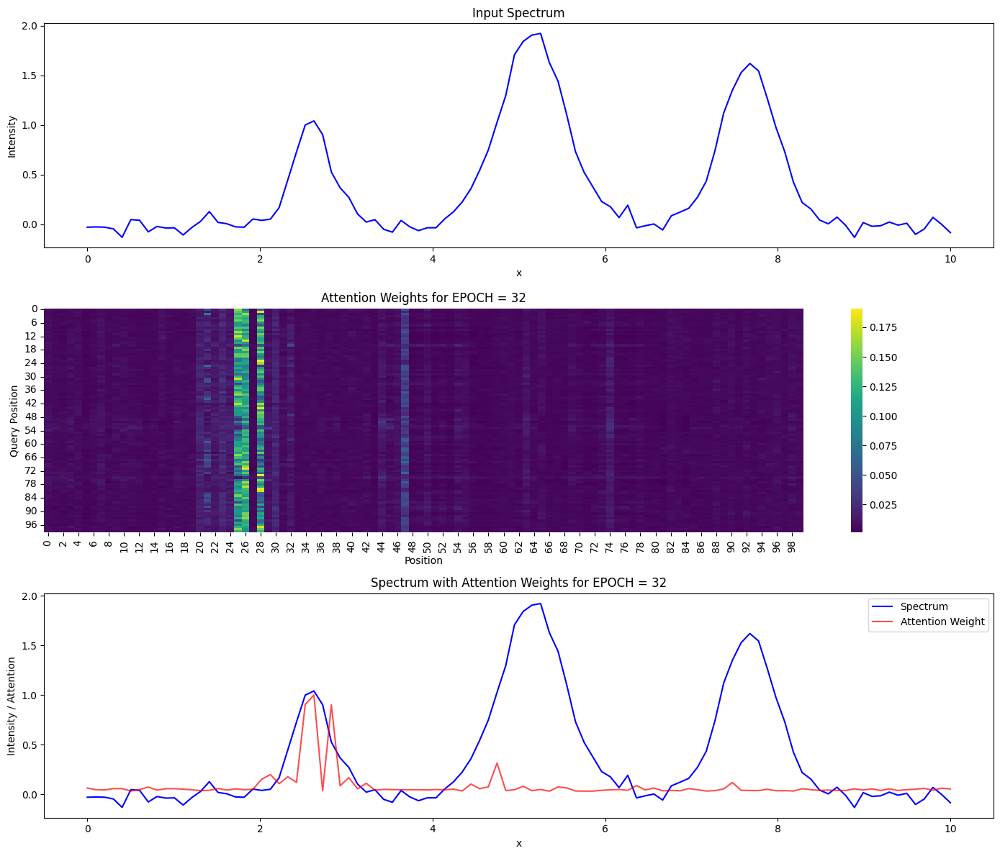

Peak positions: [2.62626263 5.25252525 7.67676768]
Attention at peaks: [1.         0.04958342 0.03947552]

Epoch 33/50, Train Loss: 0.0022, Val Loss: 0.0017
Starting EPCOH = 33
Sample 1 - True A1: 1.0618
Predicted A1: 1.0110


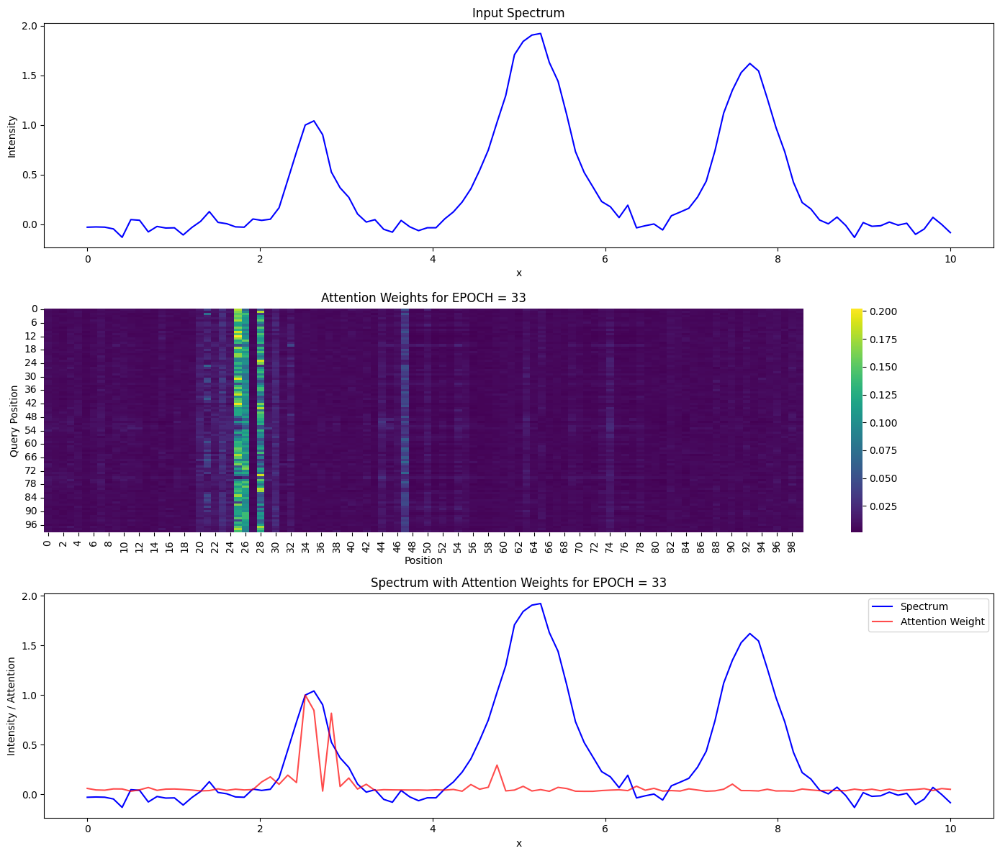

Peak positions: [2.62626263 5.25252525 7.67676768]
Attention at peaks: [0.84572226 0.04805844 0.03810313]

Epoch 34/50, Train Loss: 0.0021, Val Loss: 0.0020
Starting EPCOH = 34
Sample 1 - True A1: 1.0618
Predicted A1: 1.0173


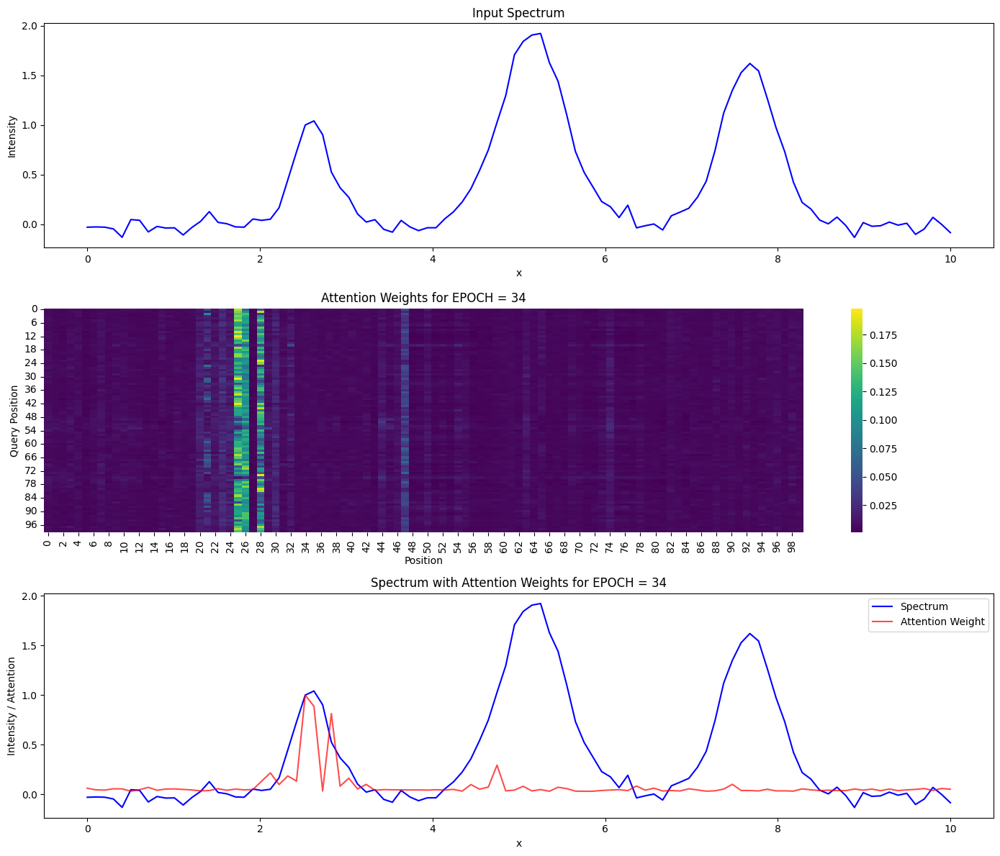

Peak positions: [2.62626263 5.25252525 7.67676768]
Attention at peaks: [0.8865593  0.04860518 0.03882038]

Epoch 35/50, Train Loss: 0.0018, Val Loss: 0.0020
Starting EPCOH = 35
Sample 1 - True A1: 1.0618
Predicted A1: 1.0231


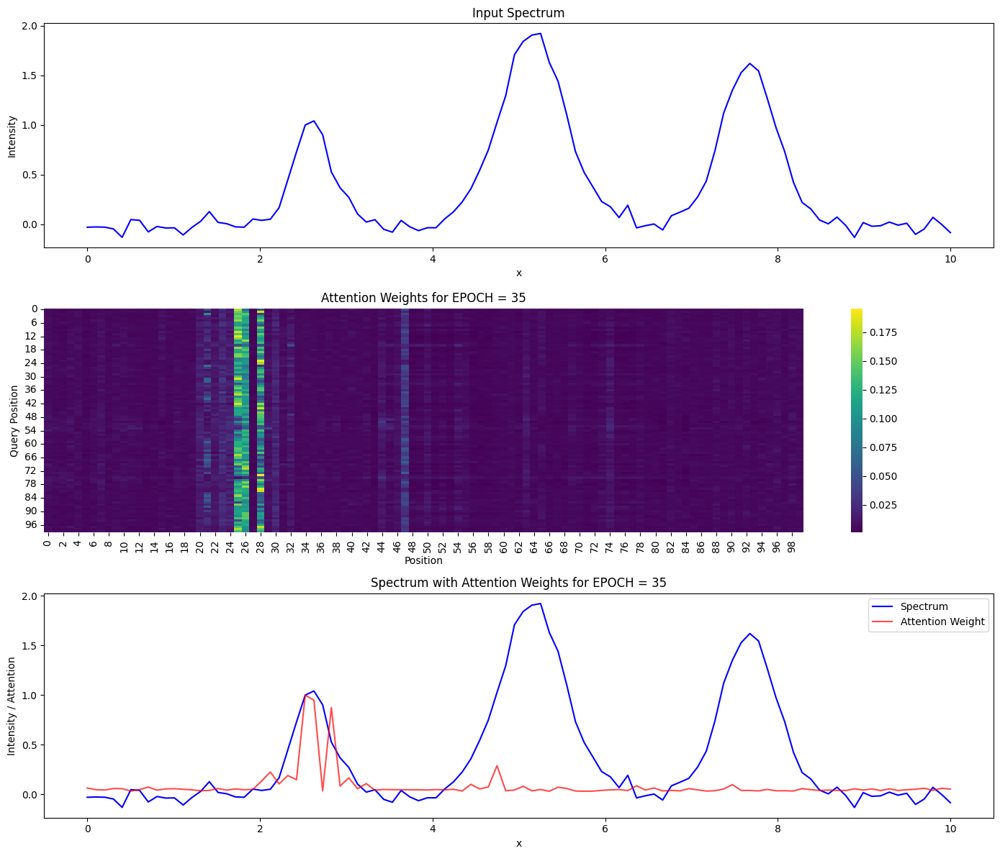

Peak positions: [2.62626263 5.25252525 7.67676768]
Attention at peaks: [0.94787425 0.0489688  0.03911888]

Epoch 36/50, Train Loss: 0.0017, Val Loss: 0.0020
Starting EPCOH = 36
Sample 1 - True A1: 1.0618
Predicted A1: 1.0195


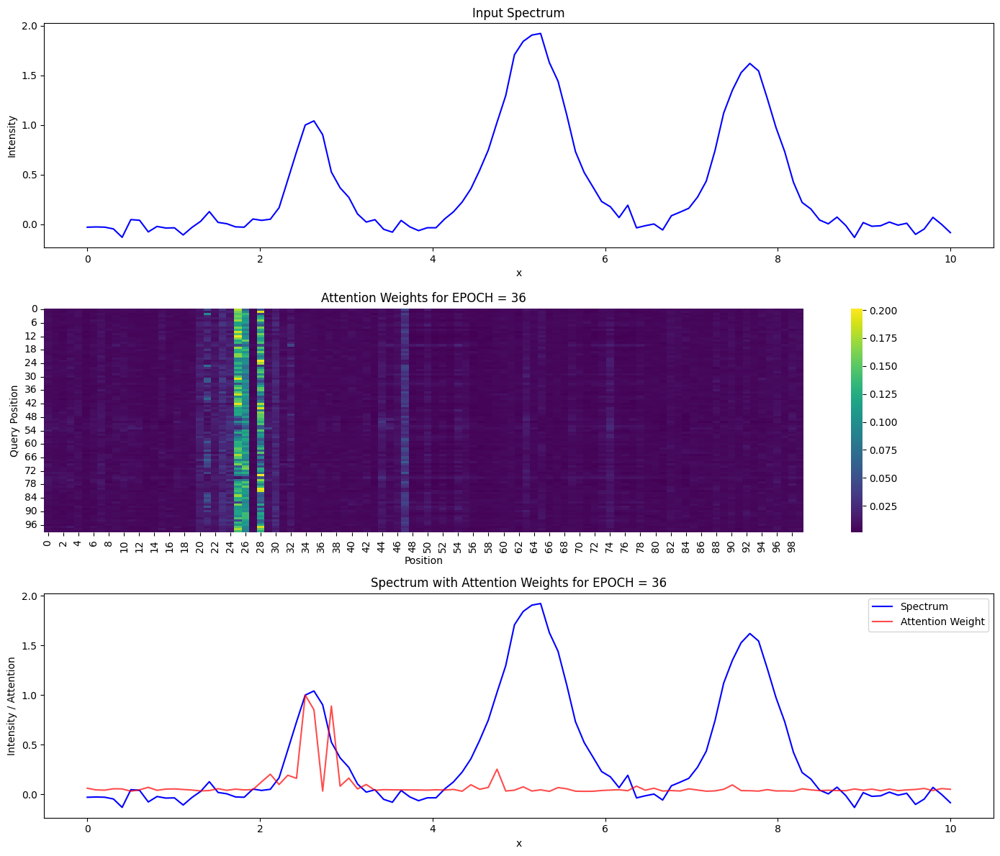

Peak positions: [2.62626263 5.25252525 7.67676768]
Attention at peaks: [0.8524284  0.04606494 0.03693505]

Epoch 37/50, Train Loss: 0.0018, Val Loss: 0.0019
Starting EPCOH = 37
Sample 1 - True A1: 1.0618
Predicted A1: 1.0126


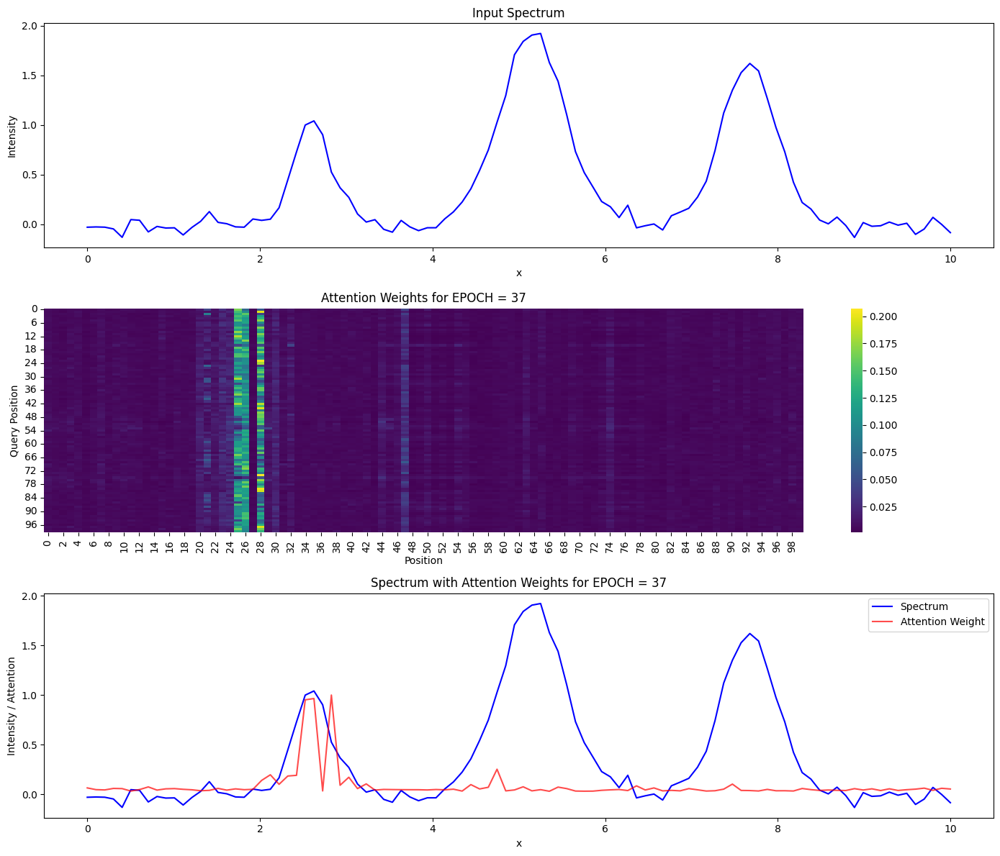

Peak positions: [2.62626263 5.25252525 7.67676768]
Attention at peaks: [0.96521324 0.04764225 0.03856224]

Epoch 38/50, Train Loss: 0.0017, Val Loss: 0.0013
Starting EPCOH = 38
Sample 1 - True A1: 1.0618
Predicted A1: 0.9936


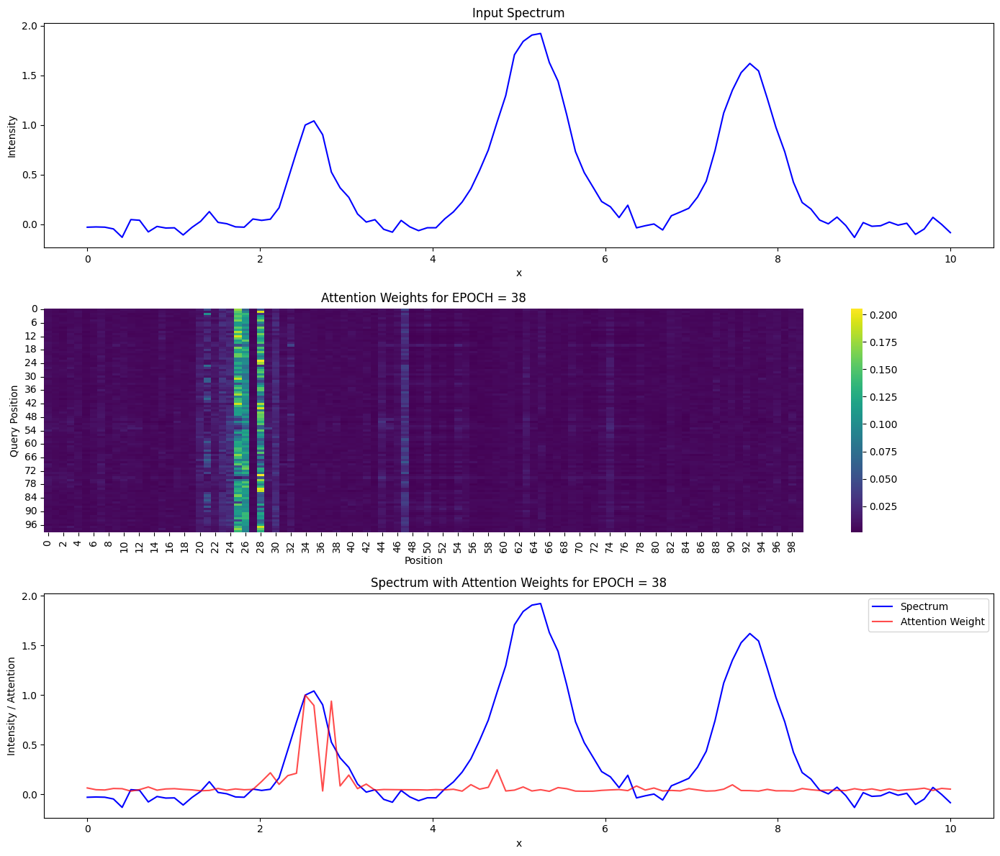

Peak positions: [2.62626263 5.25252525 7.67676768]
Attention at peaks: [0.89514536 0.04695282 0.03802749]

Epoch 39/50, Train Loss: 0.0017, Val Loss: 0.0016
Starting EPCOH = 39
Sample 1 - True A1: 1.0618
Predicted A1: 1.0221


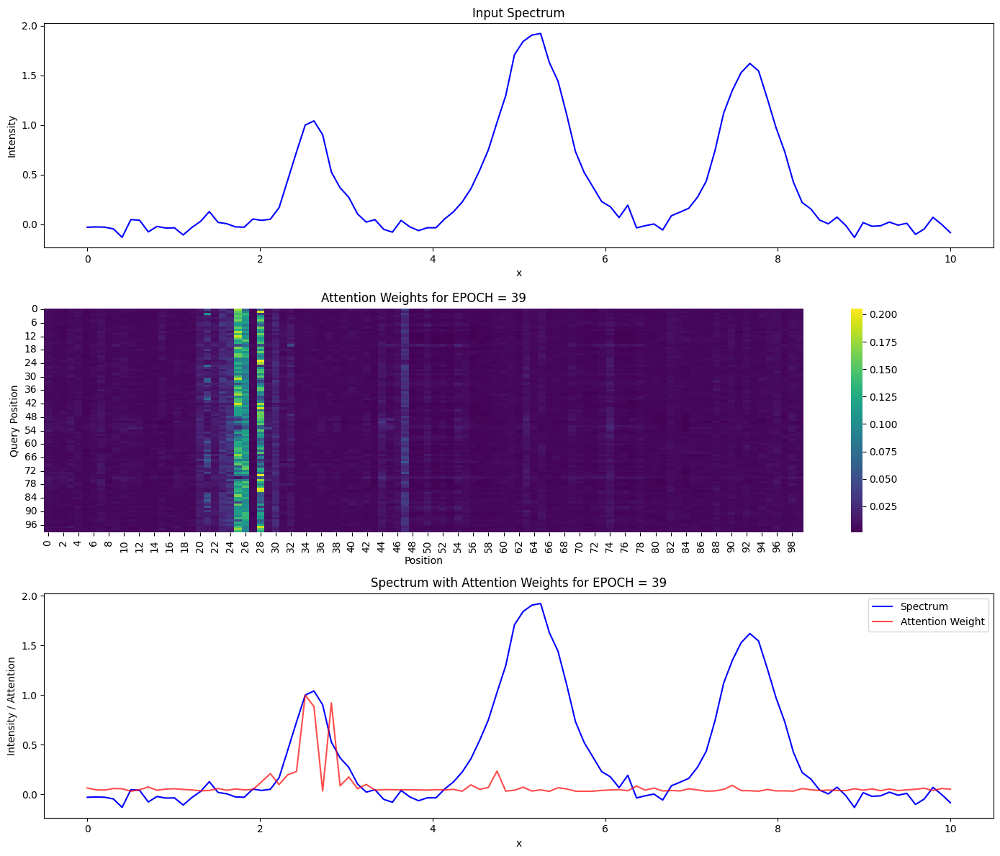

Peak positions: [2.62626263 5.25252525 7.67676768]
Attention at peaks: [0.8840477  0.04575407 0.03690177]

Epoch 40/50, Train Loss: 0.0017, Val Loss: 0.0015
Starting EPCOH = 40
Sample 1 - True A1: 1.0618
Predicted A1: 1.0244


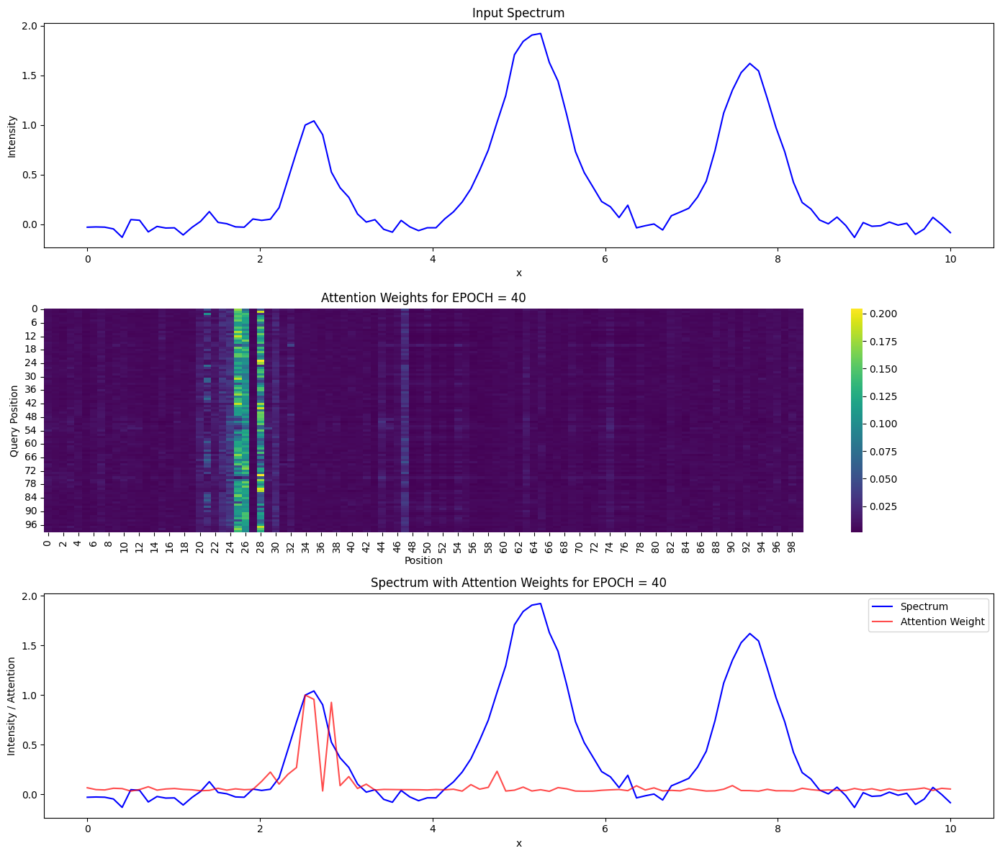

Peak positions: [2.62626263 5.25252525 7.67676768]
Attention at peaks: [0.95641404 0.04696888 0.03792309]

Epoch 41/50, Train Loss: 0.0016, Val Loss: 0.0015
Starting EPCOH = 41
Sample 1 - True A1: 1.0618
Predicted A1: 1.0116


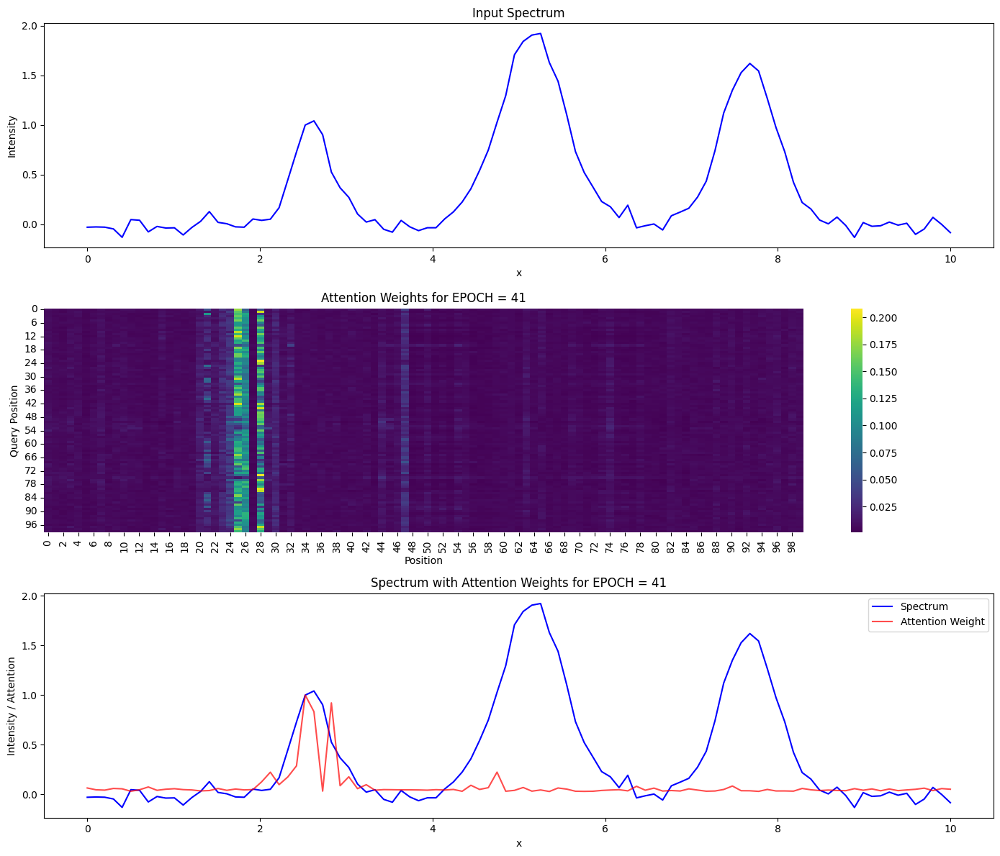

Peak positions: [2.62626263 5.25252525 7.67676768]
Attention at peaks: [0.8325832  0.04459911 0.03639225]

Epoch 42/50, Train Loss: 0.0019, Val Loss: 0.0015
Starting EPCOH = 42
Sample 1 - True A1: 1.0618
Predicted A1: 0.9875


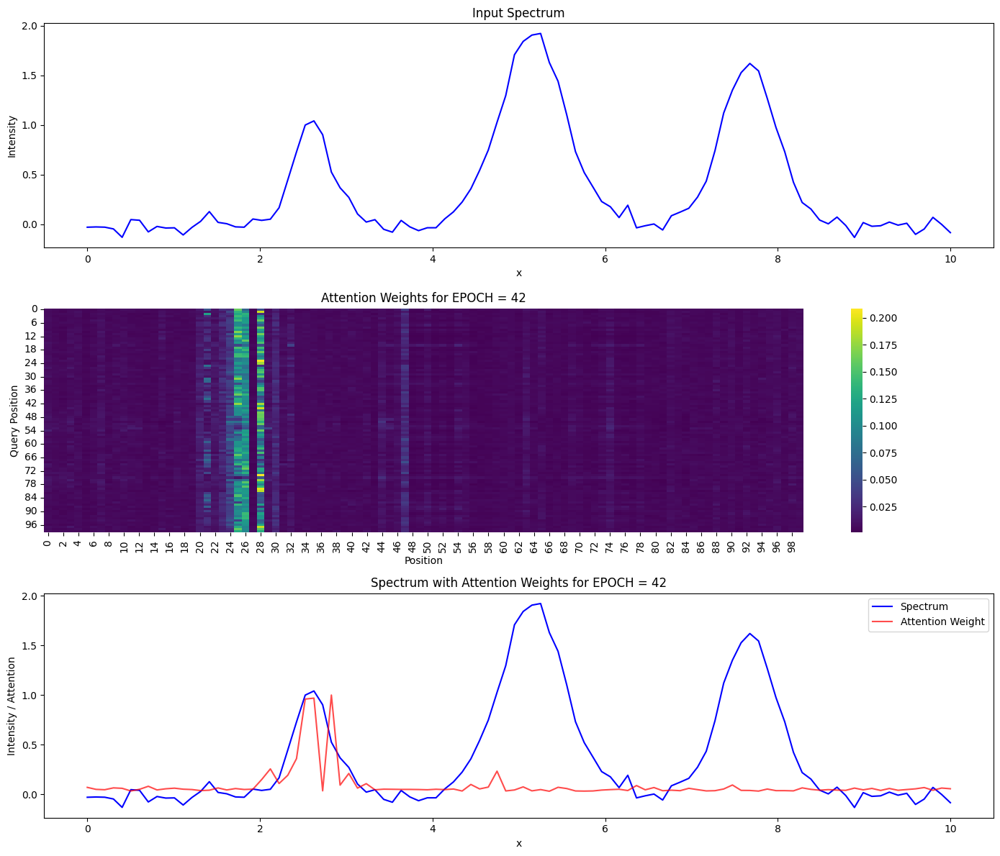

Peak positions: [2.62626263 5.25252525 7.67676768]
Attention at peaks: [0.969134   0.04844759 0.03951078]

Epoch 43/50, Train Loss: 0.0021, Val Loss: 0.0042
Starting EPCOH = 43
Sample 1 - True A1: 1.0618
Predicted A1: 1.0565


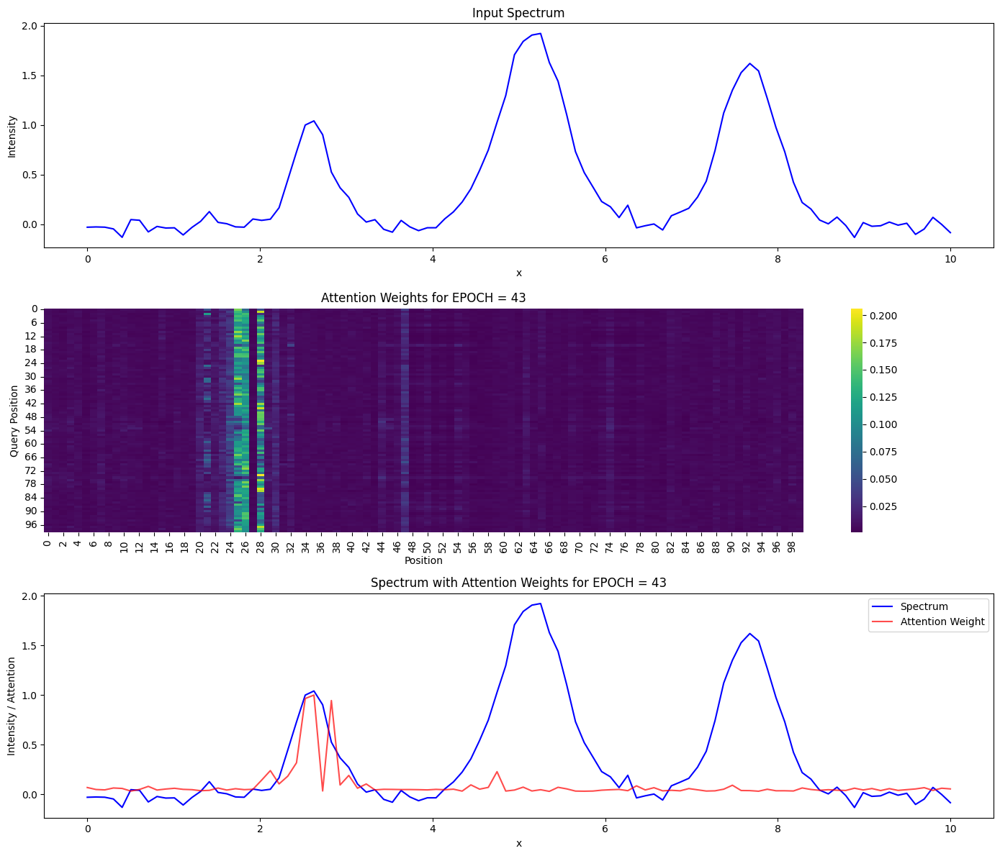

Peak positions: [2.62626263 5.25252525 7.67676768]
Attention at peaks: [1.         0.04692971 0.03799784]

Epoch 44/50, Train Loss: 0.0022, Val Loss: 0.0013
Starting EPCOH = 44
Sample 1 - True A1: 1.0618
Predicted A1: 1.0226


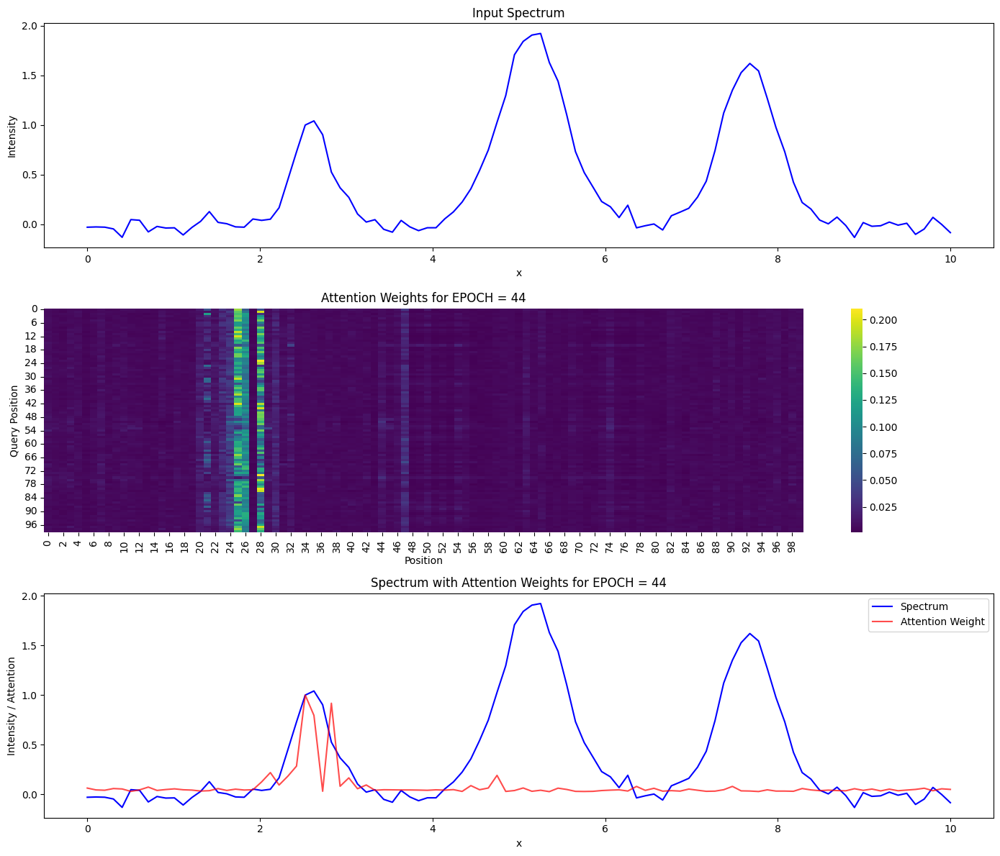

Peak positions: [2.62626263 5.25252525 7.67676768]
Attention at peaks: [0.79518133 0.04169783 0.03385114]

Epoch 45/50, Train Loss: 0.0018, Val Loss: 0.0018
Starting EPCOH = 45
Sample 1 - True A1: 1.0618
Predicted A1: 1.0250


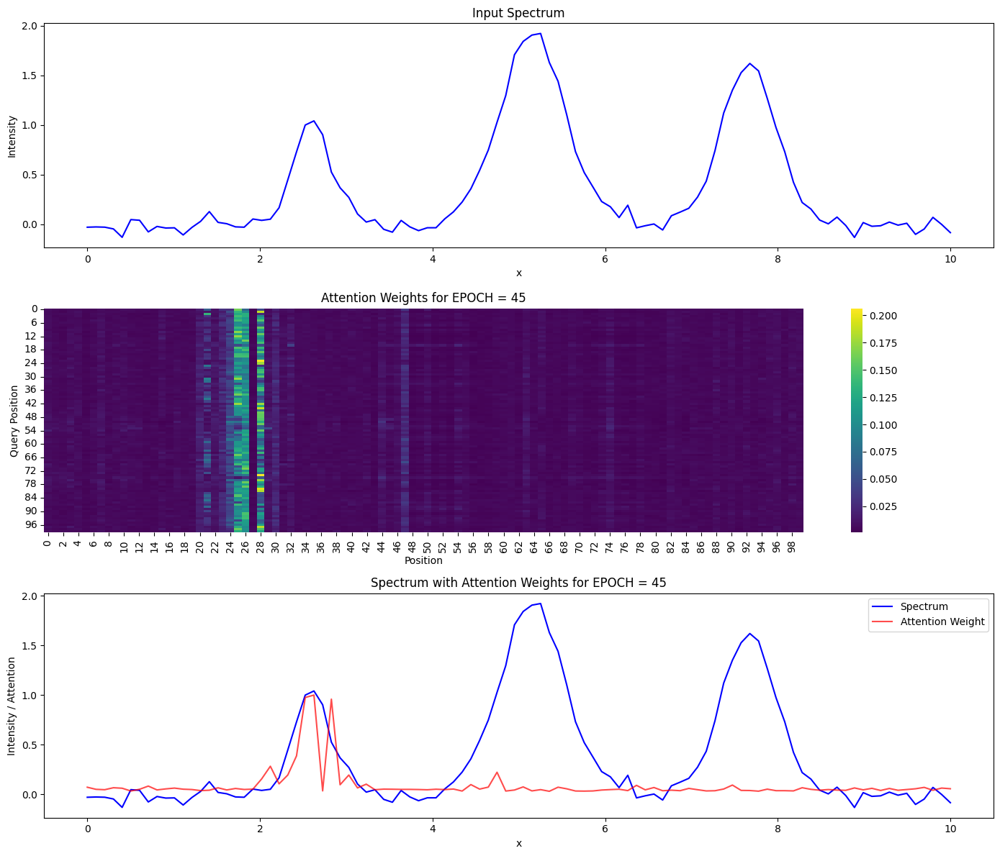

Peak positions: [2.62626263 5.25252525 7.67676768]
Attention at peaks: [1.         0.04784143 0.03892922]

Epoch 46/50, Train Loss: 0.0017, Val Loss: 0.0013
Starting EPCOH = 46
Sample 1 - True A1: 1.0618
Predicted A1: 1.0151


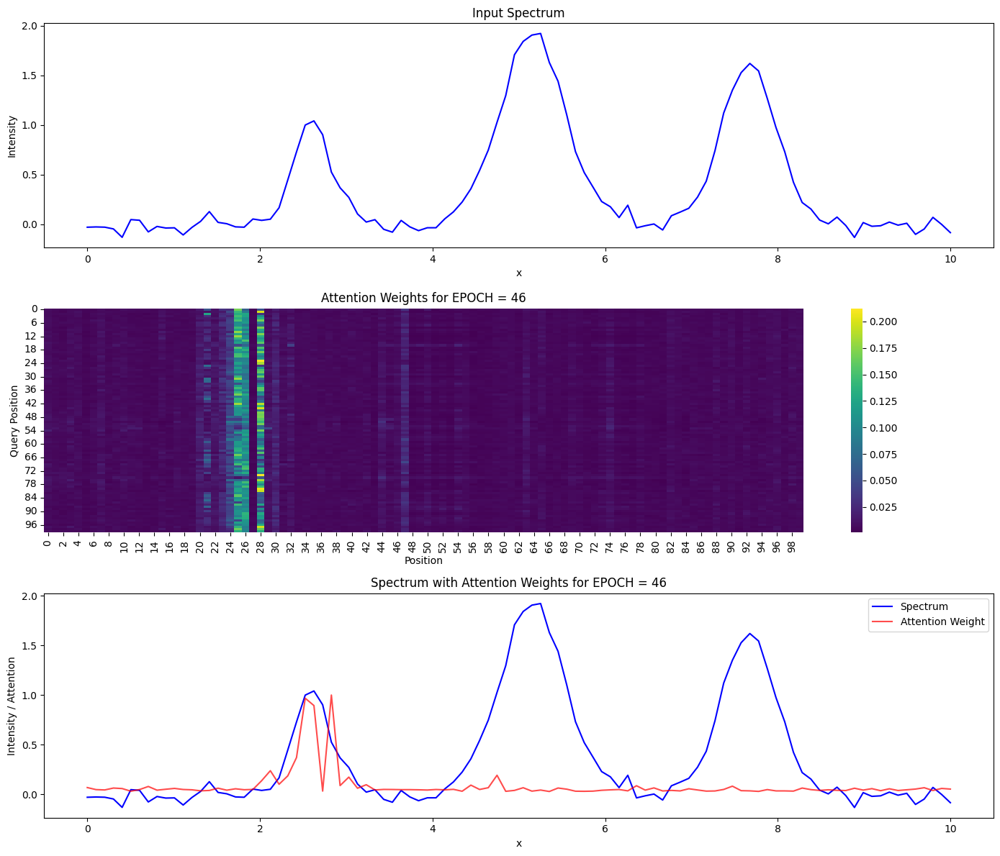

Peak positions: [2.62626263 5.25252525 7.67676768]
Attention at peaks: [0.8942093  0.04358598 0.03556306]

Epoch 47/50, Train Loss: 0.0018, Val Loss: 0.0014
Starting EPCOH = 47
Sample 1 - True A1: 1.0618
Predicted A1: 1.0007


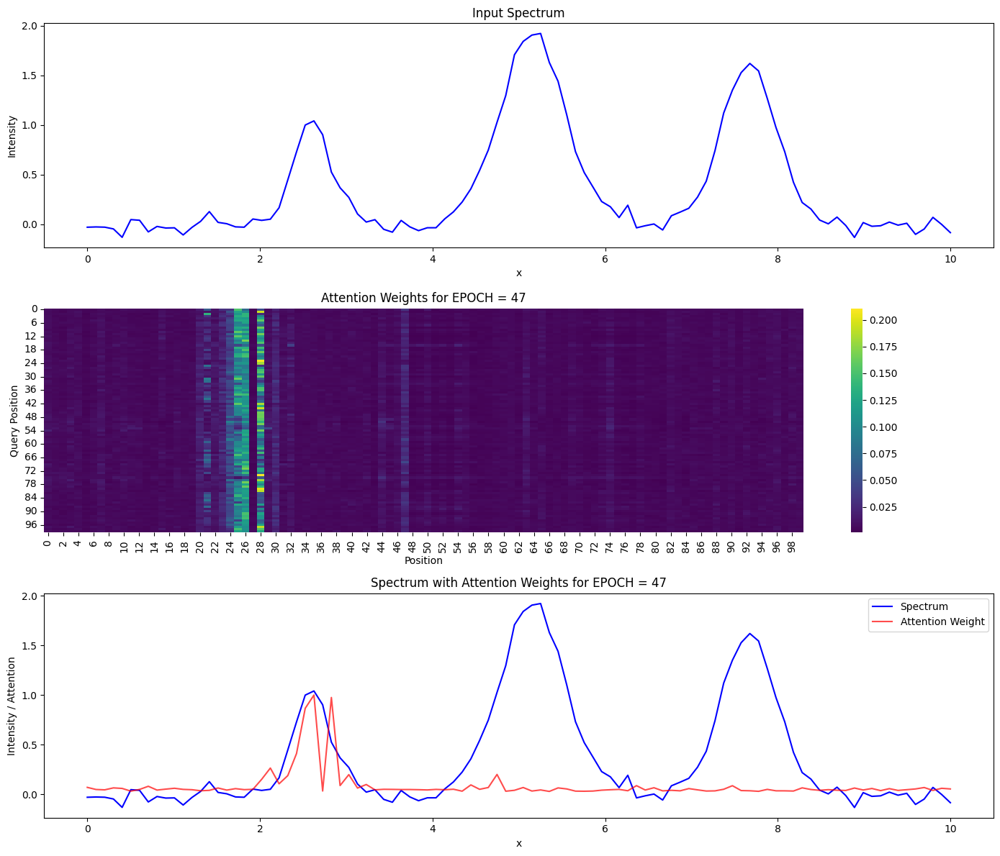

Peak positions: [2.62626263 5.25252525 7.67676768]
Attention at peaks: [1.         0.0447576  0.03648007]

Epoch 48/50, Train Loss: 0.0024, Val Loss: 0.0025
Starting EPCOH = 48
Sample 1 - True A1: 1.0618
Predicted A1: 1.0327


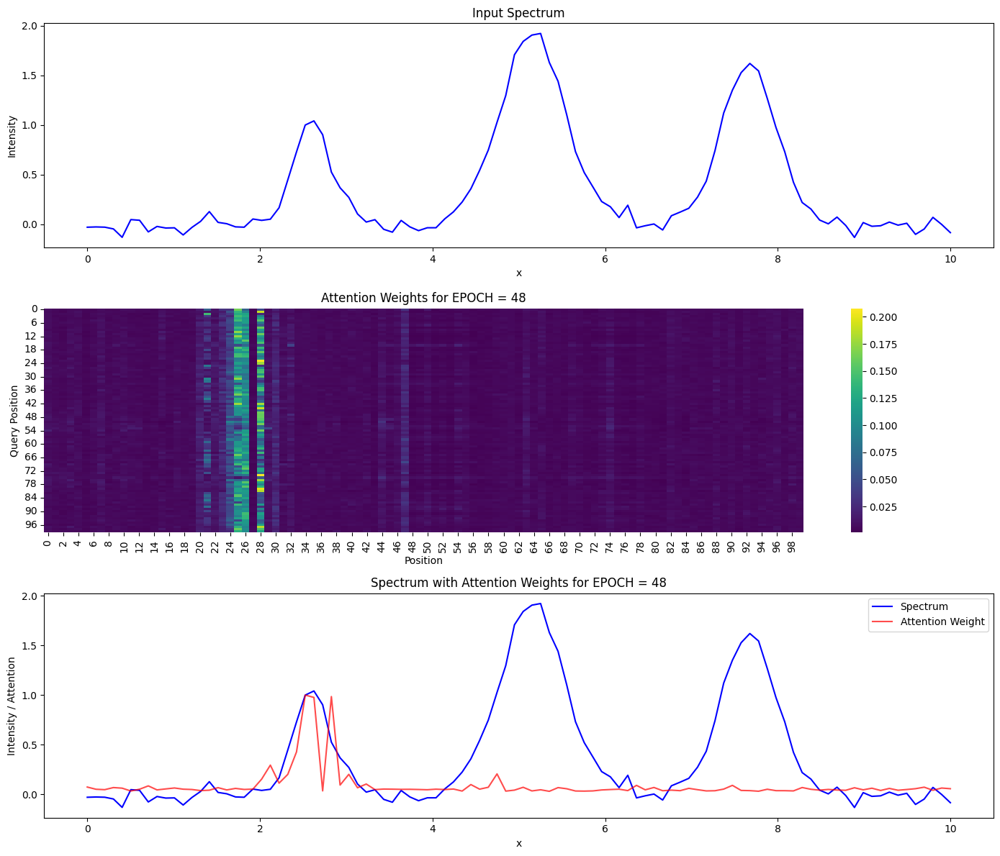

Peak positions: [2.62626263 5.25252525 7.67676768]
Attention at peaks: [0.97621274 0.04644152 0.03779322]

Epoch 49/50, Train Loss: 0.0016, Val Loss: 0.0013
Starting EPCOH = 49
Sample 1 - True A1: 1.0618
Predicted A1: 1.0175


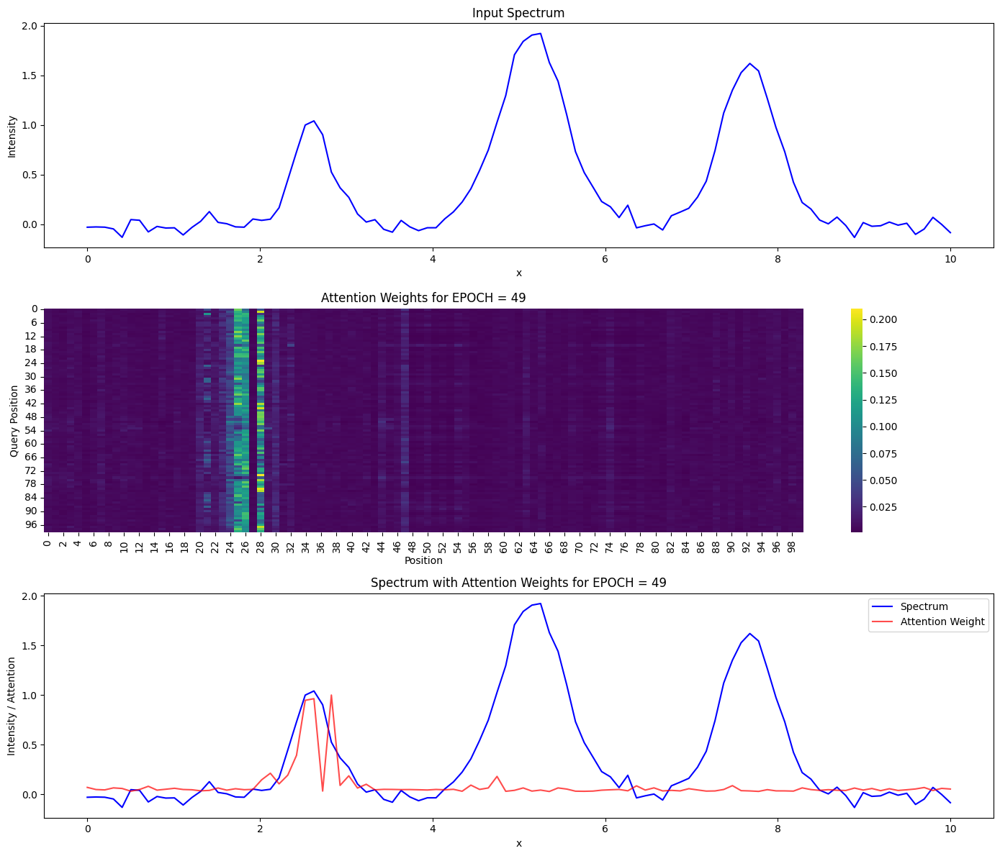

Peak positions: [2.62626263 5.25252525 7.67676768]
Attention at peaks: [0.9635497  0.04328203 0.03490209]

Epoch 50/50, Train Loss: 0.0017, Val Loss: 0.0036


In [7]:
model = TransformerRegressor(input_dim=n_points)
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)


n_epochs = 50
train_losses = []
val_losses = []

# Generate data
X_train, A1_values, A2_values, A3_values, f1_values, w1_values = generate_data(n_samples)
X_val, A1_val, A2_val, A3_val, f1_val, w1_val = generate_data(100)

# Use A1 as the target peak
y_train = A1_values
y_val = A1_val

X_train_tensor = torch.FloatTensor(X_train)
y_train_tensor = torch.FloatTensor(y_train).unsqueeze(1)
X_val_tensor = torch.FloatTensor(X_val)
y_val_tensor = torch.FloatTensor(y_val).unsqueeze(1)

train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
val_dataset = TensorDataset(X_val_tensor, y_val_tensor)
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32)

for epoch in range(n_epochs):
    print(f"Starting EPCOH = {epoch}")
    # Test the model on a few examples from the validation set on this epoch
    if epoch % 1 == 0: ######## see attention evolution
        for i in range(1):
            print(f"Sample {i+1} - True A1: {y_val[i]:.4f}")
            spectrum = X_val[i]

            with torch.no_grad():
                model.eval()
                pred = model(torch.FloatTensor(spectrum).unsqueeze(0))
                print(f"Predicted A1: {pred.item():.4f}")
            attention_weights = visualize_attention(model, spectrum, epoch)
            from scipy.signal import find_peaks
            peaks, _ = find_peaks(spectrum, height=0.3)

            print(f"Peak positions: {x_range[peaks]}")
            print(f"Attention at peaks: {attention_weights[peaks]}")
            print()
    model.train()
    epoch_loss = 0
    for X_batch, y_batch in train_loader:
        optimizer.zero_grad()

        y_pred = model(X_batch)
        loss = criterion(y_pred, y_batch)
        loss.backward()
        optimizer.step()

        epoch_loss += loss.item()

    train_losses.append(epoch_loss / len(train_loader))

    # Validation
    model.eval()
    val_loss = 0
    with torch.no_grad():
        for X_batch, y_batch in val_loader:
            y_pred = model(X_batch)
            val_loss += criterion(y_pred, y_batch).item()

    val_losses.append(val_loss / len(val_loader))

    print(f'Epoch {epoch+1}/{n_epochs}, Train Loss: {train_losses[-1]:.4f}, Val Loss: {val_losses[-1]:.4f}')

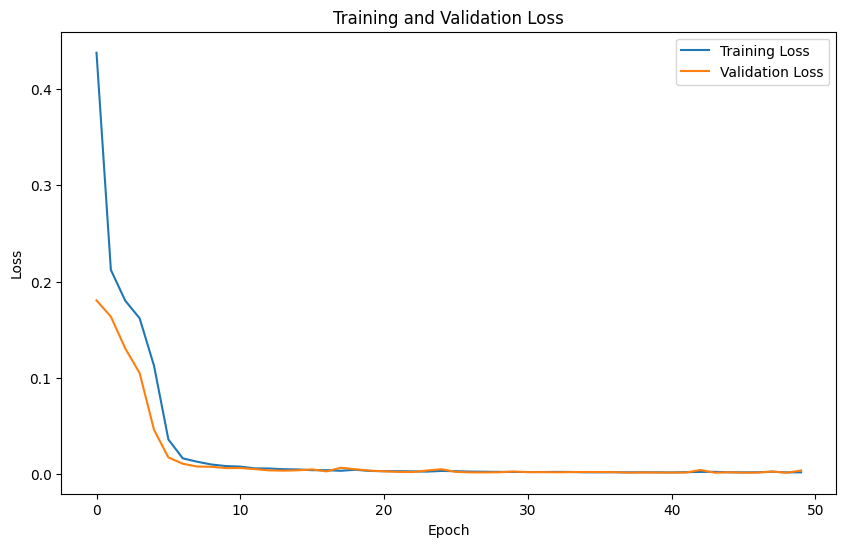

In [8]:
# Plot training and validation loss
plt.figure(figsize=(10, 6))
plt.plot(train_losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()

# 4. Attention and SHAP for the explainability

In [9]:
from scipy.optimize import curve_fit
from scipy.stats import chisquare

def calc_attention(model, spectrum, epoch):
    import torch
    import seaborn as sns
    import numpy as np

    spectrum_tensor = torch.FloatTensor(spectrum)#.unsqueeze(0)

    with torch.no_grad():
        model.eval()
        _ = model(spectrum_tensor)
        attention_weights = model.attention.attention_weights.detach().cpu().numpy()

    avg_attention = attention_weights[0].mean(axis=0)
    attention_sum = avg_attention.sum(axis=0)
    attention_sum = attention_sum / attention_sum.max()

    return attention_sum

def wrapped_model(x_numpy):
    model.cuda()
    model.eval()
    with torch.no_grad():
        x_tensor = torch.tensor(x_numpy, dtype=torch.float32).to('cuda')  # shape: (batch, input_dim)
        output = model(x_tensor)  # shape: (batch, 1)
        return output.cpu().numpy().reshape(-1)  # shape: (batch,)

def rmse(y_true, y_pred):
    return np.sqrt(np.mean((y_true - y_pred) ** 2))

In [10]:
#generate some data
X_val, A1_val, A2_val, A3_val, f1_val, w1_val = generate_data(n_samples, seed=42)
X_val.shape

(500, 100)

In [11]:
#shap model
np.random.seed(42)
background = shap.kmeans(X_train, 50)
explainer = shap.KernelExplainer(wrapped_model, background)  # background set

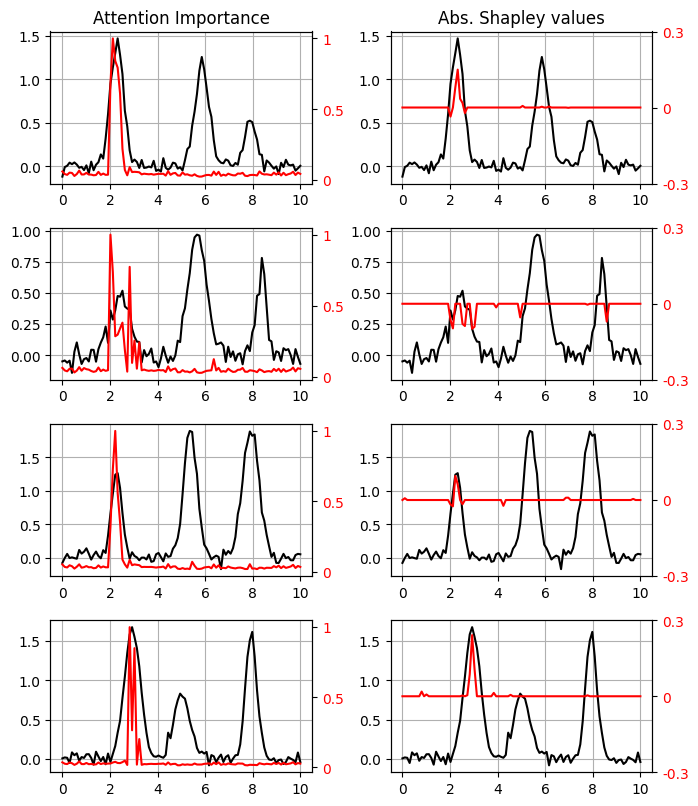

In [12]:
ii = np.random.choice(np.arange(len(X_val)), size=4, replace=False)

fig, ax = plt.subplots(4, 2, figsize=(7, 8))

for i,j in enumerate(ii):

  sh_v = explainer.shap_values(X_val[j], nsamples=100)
  att_w = calc_attention(model.to('cpu'), X_val[j:j+1], 50)

  ax[i,1].plot(x_range, X_val[j], color='black')
  ax_ = ax[i,1].twinx()
  ax_.plot(x_range, sh_v, color='r')
  ax_.set_yticks([-.3, 0, .3],[-.3, 0, .3], c='r')

  ax[i,0].plot(x_range, X_val[j], color='black')
  ax_ = ax[i,0].twinx()
  ax_.plot(x_range, att_w, color='r')
  ax_.set_yticks([0, .5, 1],[0, .5, 1], c='r')

for _ in ax.flatten():
  _.grid()

plt.tight_layout()

ax[0,0].set_title('Attention Importance')
ax[0,1].set_title('Abs. Shapley values')

fig.savefig('figs2.jpg', bbox_inches='tight', dpi=300)

In [13]:
np.random.seed(42)
sh_v1 = explainer.shap_values(X_val, nsamples=400)
att_w1 = calc_attention(model.to('cpu'), X_val, 50)
pred = model(torch.FloatTensor(X_val)).T

  0%|          | 0/500 [00:00<?, ?it/s]

In [14]:
#gaussian fitting of the attention and shap results
popt_list = []
popt_list_sh = []
for i,xval in enumerate(X_val):
  att = calc_attention(model.to('cpu'), X_val[i:i+1], 50)


  p0 = [att.max(), x_range[np.argmax(att)], 3]
  popt, pcov = curve_fit(gaussian, x_range, att, p0=p0, maxfev = 50000)
  popt_list.append(popt)

  sh = sh_v1[i]
  p0 = [np.abs(sh).max(), x_range[np.argmax(np.abs(sh))], 3]
  popt_sh, pcov = curve_fit(gaussian, x_range, sh, p0=p0, maxfev = 50000)
  if popt_sh[1] > 10 or popt_sh[1] < 0:
    popt_sh = p0
  popt_list_sh.append(popt_sh)

popt_list = np.array(popt_list)
popt_list_sh = np.array(popt_list_sh)

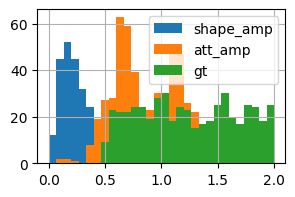

In [15]:
fig = plt.figure(figsize=(3.2, 2))

_ = plt.hist(popt_list_sh[:,0], label='shape_amp', bins=30, range=[0,2])
_ = plt.hist(popt_list[:,0], label='att_amp', bins=30, range=[0,2])
_ = plt.hist(A1_val, label='gt', bins=30, range=[0,2])
plt.legend()
plt.grid()

In [16]:
#model's performance
rmse = np.sqrt(np.mean((pred.detach().numpy() - A1_val)**2))

print('RMSE',round(rmse,3))
print('RMSE/(mean amp.)',round(100* rmse / np.mean(A1_val),2))

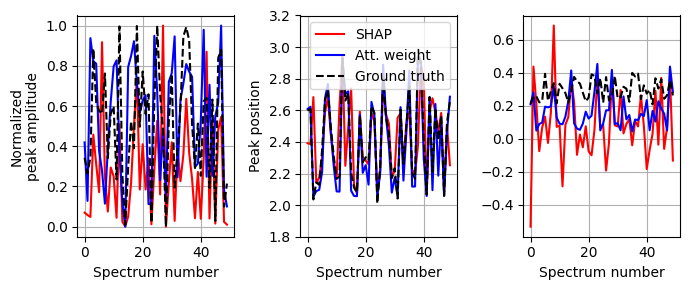

In [17]:
fig, ax = plt.subplots(1, 3,figsize=(7, 3))

ax[0].plot(normalize(popt_list_sh[:,0][:50]), label='SHAP', c='r')
ax[0].plot(normalize(popt_list[:,0][:50]), label='Att. weight', c='b')
ax[0].plot(normalize(A1_val[:50]), '--', label='Ground truth', c='black')
ax[0].set_ylabel('Normalized\npeak amplitude')


ax[1].plot(popt_list_sh[:,1][:50], label='SHAP', c='r')
ax[1].plot(popt_list[:,1][:50], label='Att. weight', c='b')
ax[1].plot(f1_val[:50], '--', label='Ground truth', c='black')

ax[2].plot(popt_list_sh[:,2][:50], label='SHAP', c='r')
ax[2].plot(popt_list[:,2][:50], label='Att. weight', c='b')
ax[2].plot(w1_val[:50], '--', label='Ground truth', c='black')

ax[1].set_ylim(1.8, 3.2)
ax[1].set_ylabel('Peak position')
ax[1].legend(fontsize=10)


for _ in ax:
  _.grid()
  _.set_xlabel('Spectrum number')

plt.tight_layout()

#fig.savefig('fitting correlations.jpg', dpi=300, bbox_inches='tight')

/tmp/ipython-input-18-2410719826.py:68: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


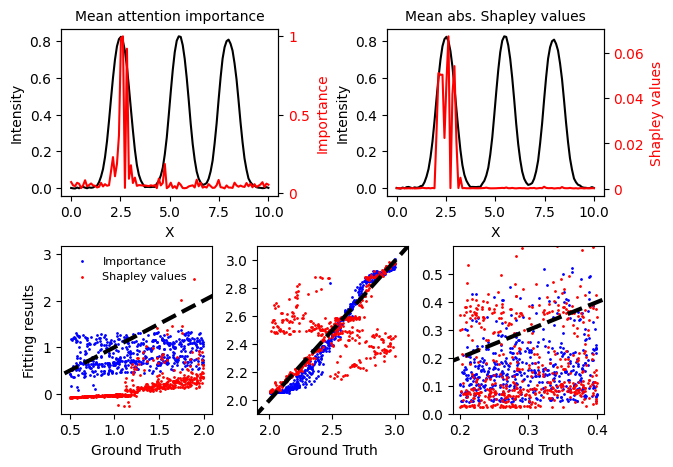

In [18]:
import matplotlib.gridspec as gridspec

# Create the main figure
fig = plt.figure(figsize=(7, 5))
outer_gs = gridspec.GridSpec(2, 1, height_ratios=[1, 1], hspace=0.3)  # vertical spacing only

# --- Top row with 2 subplots and custom horizontal spacing ---
top_gs = gridspec.GridSpecFromSubplotSpec(1, 2, subplot_spec=outer_gs[0], wspace=.5)
ax1 = fig.add_subplot(top_gs[0, 0])
ax2 = fig.add_subplot(top_gs[0, 1])

# --- Bottom row with 3 subplots, tight layout ---
bottom_gs = gridspec.GridSpecFromSubplotSpec(1, 3, subplot_spec=outer_gs[1], wspace=0.3)
ax3 = fig.add_subplot(bottom_gs[0, 0])
ax4 = fig.add_subplot(bottom_gs[0, 1])
ax5 = fig.add_subplot(bottom_gs[0, 2])

ax1.set_title("Mean attention importance", fontsize=10)
ax2.set_title("Mean abs. Shapley values", fontsize=10)

# ax1: primary and twin axes
ax1.plot(x_range, X_val.mean(0), color='black')
ax1.set_xlabel('X')
ax1.set_ylabel('Intensity')
ax1_ = ax1.twinx()
ax1_.plot(x_range, att_w1, color='r')
ax1_.set_yticks([0, .5, 1])
ax1_.set_yticklabels([0, .5, 1], color='r')
ax1_.set_ylabel('Importance', color='r')

# ax2: primary and twin axes
ax2.plot(x_range, X_val.mean(0), color='black')
ax2.set_xlabel('X')
ax2.set_ylabel('Intensity')
ax2_ = ax2.twinx()
ax2_.plot(x_range, abs(sh_v1).mean(0), color='r')
ax2_.set_yticks([0, .02, .04, .06])
ax2_.set_yticklabels([0, .02, .04, .06], color='r')
ax2_.set_ylabel('Shapley values', color='r')


ax3.scatter(A1_val, popt_list[:,0], s=1, c='b', label='Importance')
ax3.scatter(A1_val, popt_list_sh[:,0], s=1, c='r', label='Shapley values')
ax3.plot(np.linspace(0,3,2), np.linspace(0,3,2), '--', c='black', lw=3)
ax3.set_xlim(A1_val.min()-.1,A1_val.max()+.1)
ax3.set_xticks([.5, 1, 1.5, 2])
ax3.legend(fontsize=8, frameon=False)

ax4.plot(np.linspace(0,3.3,2), np.linspace(0,3.3,2), '--', c='black', lw=3)
ax4.scatter(f1_val, popt_list[:,1], s=1, c='b', label='Importance')
ax4.scatter(f1_val, popt_list_sh[:,1], s=1, c='r', label='Shapley values')

ax4.set_xlim(f1_val.min()-.1,f1_val.max()+.1)
ax4.set_ylim(f1_val.min()-.1,f1_val.max()+.1)

ax5.plot(np.linspace(0,3.3,2), np.linspace(0,3.3,2), '--', c='black', lw=3)
ax5.scatter(w1_val, abs(popt_list[:,2]), s=1, c='b', label='Importance')
ax5.scatter(w1_val, abs(popt_list_sh[:,2]), s=1, c='r', label='Shapley values')

ax5.set_xlim(w1_val.min()-.01,w1_val.max()+.01)
ax5.set_ylim(0,w1_val.max()+.2)

ax3.set_ylabel('Fitting results')
ax3.set_xlabel('Ground Truth')
ax4.set_xlabel('Ground Truth')
ax5.set_xlabel('Ground Truth')

plt.tight_layout()
plt.show()

#fig.savefig('fig1_at.jpg', dpi=300, bbox_inches='tight')

In [24]:
print(f'Correlation Att._AMP-GT: {round(np.corrcoef(A1_val, popt_list[:,0])[0,1],2)}')
print(f'Correlation Att._POS-GT: {round(np.corrcoef(f1_val, popt_list[:,1])[0,1],2)}')
print('\n')
print(f'Correlation SHAP_AMP-GT: {round(np.corrcoef(A1_val, popt_list_sh[:,0])[0,1],2)}')
print(f'Correlation SHAP_POS)-GT: {round(np.corrcoef(f1_val, popt_list_sh[:,1])[0,1],2)}')
print('\n')
rmse_f = round((np.mean((popt_list[:,1] - f1_val)**2))**0.5,3)
print('Attention RMSE_POS:', rmse_f, "Percentage of average:", round(100*rmse_f/ np.mean(f1_val),1))
rmse_f_sh = round((np.mean((popt_list_sh[:,1] - f1_val)**2))**0.5,3)
print('SHAP RMSE_POS:', rmse_f_sh, "Percentage of average:", round(100*rmse_f_sh/ np.mean(f1_val),1))

Correlation Att._AMP-GT: 0.28
Correlation Att._POS-GT: 0.97


Correlation SHAP_AMP-GT: 0.63
Correlation SHAP_POS)-GT: 0.45


Attention RMSE_POS: 0.083 Percentage of average: 3.3
SHAP RMSE_POS: 0.31 Percentage of average: 12.4


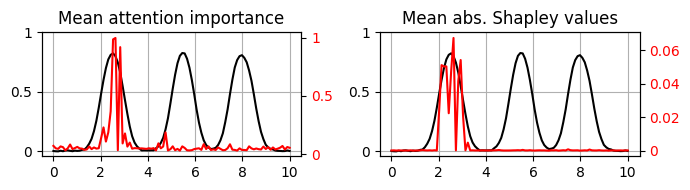

In [26]:
#average atention and shap
fig, ax = plt.subplots(1, 2, figsize=(7, 2))

ax[0].plot(x_range, X_val.mean(0), color='black')
ax_ = ax[0].twinx()
ax_.plot(x_range, att_w1, color='r')
ax_.set_yticks([0, .5, 1],[0, .5, 1], c='r')

ax[1].plot(x_range, X_val.mean(0), color='black')
ax_ = ax[1].twinx()
ax_.plot(x_range, abs(sh_v1).mean(0), color='r')
ax_.set_yticks([0, .02, .04, .06], [0, .02, .04, .06], c='r')

for _ in ax.flatten():
  _.grid()
  _.set_yticks([0, .5, 1], [0, .5, 1])


ax[0].set_title('Mean attention importance')
ax[1].set_title('Mean abs. Shapley values')

plt.tight_layout()

#fig.savefig('mean_att_shap.jpg', dpi=300, bbox_inches='tight')